In [0]:
import pandas as pd
import numpy as np
import scipy.integrate as integrate
from scipy import interpolate
import math
import matplotlib.pyplot as plt

plt.style.use('ggplot')
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
import sklearn as skl

# Load data with google colab 

In [2]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  

Saving option.csv to option.csv
Saving underlying.csv to underlying.csv
Saving vol.csv to vol.csv
Saving dividend.csv to dividend.csv
Saving discount.csv to discount.csv
User uploaded file "option.csv" with length 15637 bytes
User uploaded file "underlying.csv" with length 19 bytes
User uploaded file "vol.csv" with length 27743 bytes
User uploaded file "dividend.csv" with length 216 bytes
User uploaded file "discount.csv" with length 4508 bytes


In [3]:
discountNative = pd.read_csv("discount.csv",decimal=",").apply(pd.to_numeric)

dividendNative = pd.read_csv("dividend.csv",decimal=",").apply(pd.to_numeric)

decimals = 3

volNative = pd.read_csv("vol.csv",decimal=",").apply(pd.to_numeric)
volNative['Strike'] = volNative['Strike'].astype(int)
volNative['Maturity'] = volNative['Maturity'].apply(lambda x: round(x, decimals))

optionNative = pd.read_csv("option.csv",decimal=",").apply(pd.to_numeric)
optionNative['Strike'] = optionNative['Strike'].astype(int)
optionNative['Maturity'] = optionNative['Maturity'].apply(lambda x: round(x, decimals))

underlyingNative = pd.read_csv("underlying.csv",decimal=",").apply(pd.to_numeric)

optionNative.head()

,Maturity,Type,Strike,Price
0,0.044,1,3600,2628.8
1,0.044,2,3600,0.1
2,0.044,1,3800,2429.2
3,0.044,2,3800,0.1
4,0.044,1,4000,2229.6


In [4]:
volNative.head()

,Active,Option\ntype,Maturity,Strike,Moneyness,Option\nprice,Implied\nvol.,Calibrated\nvol.,Market vol. -\nCalibrated vol.
0,-1,2,0.044,3600,0.579,0.000,0.763,-1.000,1.763
1,1,1,0.044,7100,1.143,0.074,0.213,0.206,0.006
2,-1,2,0.044,3800,0.612,0.000,0.725,-1.000,1.725
3,1,1,0.044,7000,1.127,0.208,0.206,0.194,0.013
4,-1,2,0.044,4000,0.644,0.000,0.650,-1.000,1.650


In [5]:
dividendNative.head()

,Maturity,Amount
0,0.043836,-7.064377
1,0.120548,13.848779
2,0.216438,4.771329
3,0.389041,5.595025
4,0.638470,0.344345


In [6]:
discountNative.head()

,Maturity,Price
0,0.083333,0.995923
1,0.166667,0.991898
2,0.250000,0.987940
3,0.333333,0.984067
4,0.416667,0.980229


In [7]:
underlyingNative.head()

,S,Repo
0,6213.84,0


# Formatting data

In [8]:
dividendDf = dividendNative.set_index('Maturity').sort_index()
dividendDf.head()


,Amount
Maturity,
0.043836,-7.064377
0.120548,13.848779
0.216438,4.771329
0.389041,5.595025
0.638470,0.344345


In [9]:
#specific treatment for collab
rateCurveDf = discountNative.set_index('Maturity').sort_index()
# save data only inferior to 1 year
rateCurveDf = rateCurveDf.loc[rateCurveDf.index <= 1.01]
rateCurveDf.head()

,Price
Maturity,
0.083333,0.995923
0.166667,0.991898
0.250000,0.987940
0.333333,0.984067
0.416667,0.980229


In [10]:

#For BS prices
r = 0.0
q = 0
dividendDf = pd.DataFrame(np.zeros_like(dividendDf), index = dividendDf.index, columns=dividendDf.columns)
rateCurveDf = pd.DataFrame(np.ones_like(rateCurveDf), index = rateCurveDf.index, columns=rateCurveDf.columns)
dividendDf.head()

,Amount
Maturity,
0.043836,0.0
0.120548,0.0
0.216438,0.0
0.389041,0.0
0.638470,0.0


In [11]:
rateCurveDf.head()

,Price
Maturity,
0.083333,1.0
0.166667,1.0
0.250000,1.0
0.333333,1.0
0.416667,1.0


In [12]:
optionDf = optionNative.set_index('Maturity').sort_index()
# save data only inferior to 1 year
optionDf = optionDf.loc[optionDf.index < 0.99]
optionDf.head()

,Type,Strike,Price
Maturity,,,
0.044,1,3600,2628.8
0.044,2,3600,0.1
0.044,1,3800,2429.2
0.044,2,3800,0.1
0.044,1,4000,2229.6


In [13]:
volDf = volNative.set_index('Maturity').sort_index()
volDf.index = np.around(volDf.index, decimals=3)
# save data only inferior to 1 year
volDf = volDf.loc[volDf.index < 0.99]
volDf.head()

,Active,Option\ntype,Strike,Moneyness,Option\nprice,Implied\nvol.,Calibrated\nvol.,Market vol. -\nCalibrated vol.
Maturity,,,,,,,,
0.044,-1,2,3600,0.579,0.000,0.763,-1.000,1.763
0.044,1,1,7100,1.143,0.074,0.213,0.206,0.006
0.044,-1,2,3800,0.612,0.000,0.725,-1.000,1.725
0.044,1,1,7000,1.127,0.208,0.206,0.194,0.013
0.044,-1,2,4000,0.644,0.000,0.650,-1.000,1.650


### Boostsrapping Rate Curve


- For bootstrapping $r$ and $q$, I assumed piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$.
- Then we can interpolate $r$ and $q$ with quadratic method (or spline).
-  Quadrature method are used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

In [0]:
def bootstrapZeroCoupon(curvePrice, name):
    completePrice = curvePrice.copy(deep=False)
    completePrice.loc[0] = 1 
    completePrice.sort_index(inplace=True)
    timeDelta = np.diff(completePrice.index)
    nbRows = timeDelta.shape[0]
    rateCurveValues = np.reshape((-np.log(completePrice)).diff().dropna().values,(nbRows,)) / timeDelta
    riskFreeCurve = pd.DataFrame(rateCurveValues,
                                 index = curvePrice.index ,
                                 columns = [name])
    #first point
    #riskFreeCurve.loc[rateCurveDf.index[0]] = (-math.log(curvePrice['price '].iloc[0])) / timeDelta[0] 
    def zeroYield(x):
      if(float(x.name) < 1):
        return (1/x - 1)/float(x.name)
      else:
        return (x**(-1/float(x.name)) - 1)
    return riskFreeCurve,curvePrice.apply(zeroYield, axis = 1)

In [0]:
#rateCurveDf.apply(math.log)#.diff().dropna().apply(math.exp)
riskFreeCurve, yieldCurve = bootstrapZeroCoupon(rateCurveDf, "Short rate")

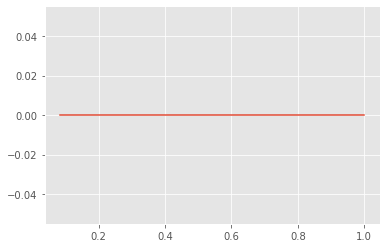

In [16]:
plt.plot(riskFreeCurve)
plt.show()

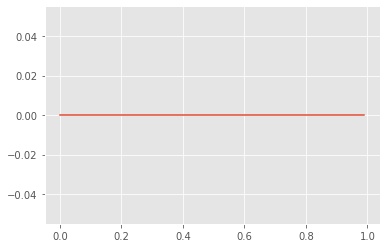

In [17]:
timeStep = np.linspace(0,0.99,100)
riskCurvespline = interpolate.interp1d(riskFreeCurve.index,
                                       riskFreeCurve['Short rate'], 
                                       fill_value= 'extrapolate', 
                                       kind ='quadratic')
interpolatedCurve = pd.Series(riskCurvespline(timeStep),index=timeStep)
plt.plot(interpolatedCurve)
plt.show()

In [18]:
riskFreeCurve.head()

,Short rate
Maturity,
0.083333,0.0
0.166667,0.0
0.250000,0.0
0.333333,0.0
0.416667,0.0


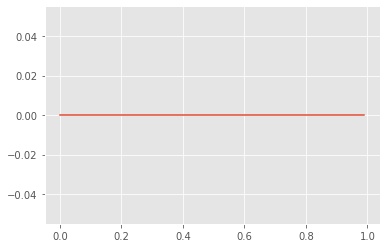

In [19]:
def interpIntegral(curve):
    #curve is piece-wise constant
    timeDelta = curve.index.to_series().diff().fillna(method='bfill')
    integralStepWise = (curve * timeDelta).cumsum()
    integralStepWise.loc[0] = 0.0
    integralStepWise.sort_index(inplace=True)
    integralSpline = interpolate.interp1d(integralStepWise.index,
                                          integralStepWise, 
                                          fill_value= 'extrapolate', 
                                          kind ='quadratic')
    return pd.Series(integralSpline(timeStep),index=timeStep), integralSpline
interpolatedIntegral, riskFreeIntegral = interpIntegral(riskFreeCurve['Short rate'])
plt.plot(interpolatedIntegral)
plt.show()

In [20]:
interpolatedIntegral

0.00    0.0
0.01    0.0
0.02    0.0
0.03    0.0
0.04    0.0
       ... 
0.95    0.0
0.96    0.0
0.97    0.0
0.98    0.0
0.99    0.0
Length: 100, dtype: float64

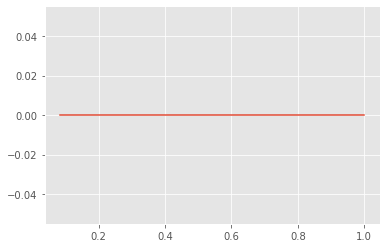

In [21]:
plt.plot(yieldCurve)
plt.show()

In [22]:
yieldCurve.head()

,Price
Maturity,
0.083333,0.0
0.166667,0.0
0.250000,0.0
0.333333,0.0
0.416667,0.0


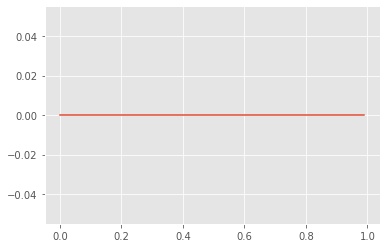

In [23]:

yieldCurvespline = interpolate.interp1d(yieldCurve.index,
                                        yieldCurve['Price'], 
                                        fill_value= 'extrapolate', 
                                        kind ='quadratic')
interpolatedCurve = pd.Series(yieldCurvespline(timeStep),index=timeStep)
plt.plot(interpolatedCurve)
plt.show()

### Boostraping dividend curve

In [0]:
def bootstrapDividend(curvePrice, underlying, name):
    priceEvolution = curvePrice['Amount'].cumsum() + underlying['S'].iloc[0]
    priceEvolution.loc[0] = underlying['S'].iloc[0]
    priceEvolution.sort_index(inplace=True)
    timeDelta = np.diff(priceEvolution.index)
    nbRows = priceEvolution.shape[0]
    rateCurveValues = (np.log(priceEvolution)).diff().dropna() / timeDelta
    riskFreeCurve = pd.DataFrame(rateCurveValues.values,
                                 index = rateCurveValues.index ,
                                 columns = [name]) 
    def divYield(x):
      return ((priceEvolution[x]/priceEvolution.iloc[0])**(1/float(x)) - 1)
    dividendYield = riskFreeCurve.index.to_series().apply(divYield) 
    return riskFreeCurve.sort_index(), dividendYield

In [0]:
#rateCurveDf.apply(math.log)#.diff().dropna().apply(math.exp)
spreadDividend,yieldDividend = bootstrapDividend(dividendDf, underlyingNative, "Spread")

In [26]:
spreadDividend.head()

,Spread
Maturity,
0.043836,0.0
0.120548,0.0
0.216438,0.0
0.389041,0.0
0.638470,0.0


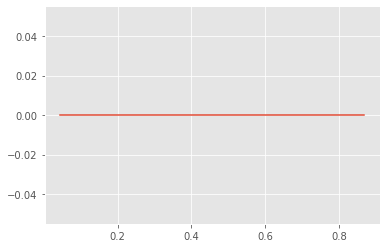

In [27]:
plt.plot(spreadDividend)
plt.show()

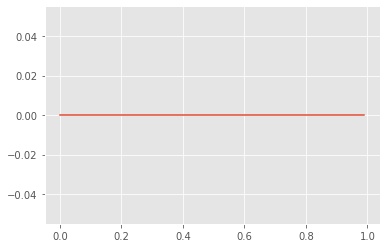

In [28]:
timeStep = np.linspace(0,0.99,100)
divSpline = interpolate.interp1d(spreadDividend.index,
                                 spreadDividend['Spread'], 
                                 fill_value= 'extrapolate', 
                                 kind ='quadratic')
interpolatedCurve = pd.Series(divSpline(timeStep),index=timeStep)
plt.plot(interpolatedCurve)
plt.show()

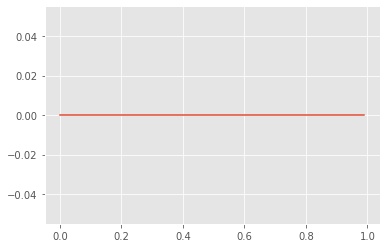

In [29]:
interpolatedIntegral, divSpreadIntegral = interpIntegral(spreadDividend['Spread'])
plt.plot(interpolatedIntegral)
plt.show()

In [30]:
yieldDividend

Maturity
0.043836    0.0
0.120548    0.0
0.216438    0.0
0.389041    0.0
0.638470    0.0
0.868607    0.0
Name: Maturity, dtype: float64

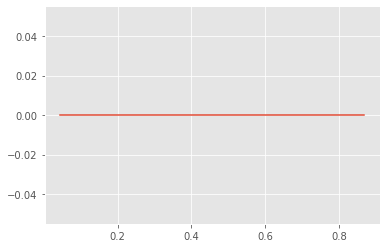

In [31]:
plt.plot(yieldDividend)
plt.show()

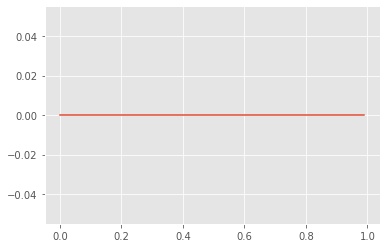

In [32]:
divYieldSpline = interpolate.interp1d(yieldDividend.index,
                                      yieldDividend.values, 
                                      fill_value= 'extrapolate', 
                                      kind ='quadratic')
interpolatedCurve = pd.Series(divYieldSpline(timeStep),index=timeStep)
plt.plot(interpolatedCurve)
plt.show()

### Splitting Call and Put

In [33]:
def formatAsGrid(typeOpt):
  grid = (optionDf[optionDf['Type']==typeOpt])
  grid['logMoneyness'] = np.log(underlyingNative['S'].iloc[0] / grid['Strike'] )
  return grid.reset_index().set_index(['Maturity','Strike']).drop(['Type'], axis = 1).sort_index()

callGrid = formatAsGrid(1)
callGrid.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Price  logMoneyness
Maturity Strike                      
0.044    3600    2628.8      0.545845
         3800    2429.2      0.491778
         4000    2229.6      0.440485
         4200    2030.1      0.391695
         4400    1830.5      0.345175

In [34]:
putGrid = formatAsGrid(2)
putGrid.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Price  logMoneyness
Maturity Strike                     
0.044    3600      0.1      0.545845
         3800      0.1      0.491778
         4000      0.1      0.440485
         4200      0.1      0.391695
         4400      0.1      0.345175

# Load test for local volatility

In [35]:
benchParsed = volNative.set_index(['Maturity','Strike']).sort_index()
benchParsed.head()

Active  ...  Market vol. -\nCalibrated vol.
Maturity Strike          ...                                
0.044    3600        -1  ...                           1.763
         3800        -1  ...                           1.725
         4000        -1  ...                           1.650
         4200        -1  ...                           1.575
         4400        -1  ...                           0.200

[5 rows x 7 columns]

In [36]:
callBench = benchParsed[benchParsed['Option\ntype'] == 1]
callBench.head()

Active  ...  Market vol. -\nCalibrated vol.
Maturity Strike          ...                                
0.044    5100         1  ...                           1.381
         5200         1  ...                           1.375
         5250         1  ...                           0.025
         5300         1  ...                           0.022
         5350         1  ...                           0.009

[5 rows x 7 columns]

In [37]:
putBench =  benchParsed[benchParsed['Option\ntype'] == 2]
putBench.head()

Active  ...  Market vol. -\nCalibrated vol.
Maturity Strike          ...                                
0.044    3600        -1  ...                           1.763
         3800        -1  ...                           1.725
         4000        -1  ...                           1.650
         4200        -1  ...                           1.575
         4400        -1  ...                           0.200

[5 rows x 7 columns]

In [38]:
putBench.columns

Index(['Active', 'Option\ntype', 'Moneyness', 'Option\nprice', 'Implied\nvol.',
       'Calibrated\nvol.', 'Market vol. -\nCalibrated vol.'],
      dtype='object')

# Neural network 

## Generate Data

In [39]:
from keras.layers import Dense, Input
from keras import Model
import keras.backend as K
import keras.activations as Act
from functools import partial
import tensorflow as tf
#from BlackScholes import *

Using TensorFlow backend.


In [0]:
n_inputs = 1
n_hidden1S = 2
n_hidden1M= 2
n_hidden2 = 5
n_hidden3 = 4
n_out = 1 

In [0]:
n_epochs = 5000
batch_size = 20
nb_batches = 10 #callGrid.shape[0] // batch_size

In [0]:
#def generateMiniBatchNew(epoch, batch_index, batch_size):
#  idx=np.random.choice(range(len(prices)), batch_size, replace=False)  
#  return prices[idx].reshape(batch_size,1), x_train[idx,0].reshape(batch_size,1), x_train[idx,1].reshape(batch_size,1)

### Why this change of variable ? 


- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q)\partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [0]:
# exp(q*T) * u(T,exp((r-q)T) * K) = w(T,K)
# u(T,K) = exp(-q*T) * w(T,exp(-(r-q)T) * K)
def changeOfVariable(s,t):
  def qInterp(m):
    return divSpreadIntegral(m).astype(np.float32)
  q = qInterp(t)
  
  def rInterp(m):
    return riskFreeIntegral(m).astype(np.float32)
  r = rInterp(t)

  factorPrice = np.exp( - q )

  divSpread = q-r

  factorStrike = np.exp( divSpread )
  adjustedStrike = np.multiply(s, factorStrike)
  return adjustedStrike, factorPrice
  

In [0]:
def changeOfVariable_BS(s,t):
  
  factorPrice = np.exp( - q*t )

  divSpread = (q-r)*t

  factorStrike = np.exp( divSpread )
  adjustedStrike = np.multiply(s, factorStrike)
  return adjustedStrike, factorPrice

### BS pricer

In [0]:
import scipy.stats as st
import numpy as np
import math

def bsformula(cp, s, k, rf, t, v, div):
        """ Price an option using the Black-Scholes model.
        cp: +1/-1 for call/put
        s: initial stock price
        k: strike price
        t: expiration time
        v: volatility
        rf: risk-free rate
        div: dividend
        """

        d1 = (np.log(s/k)+(rf-div+0.5*v*v)*t)/(v*np.sqrt(t))
        d2 = d1 - v*np.sqrt(t)

        optprice = (cp*s*np.exp(-div*t)*st.norm.cdf(cp*d1)) - (cp*k*np.exp(-rf*t)*st.norm.cdf(cp*d2))
        delta = cp*st.norm.cdf(cp*d1)
        vega  = s*np.sqrt(t)*st.norm.pdf(d1)
        return optprice, delta, vega

In [0]:
import scipy.stats as st

def dpdf(x):
    v = 1
    return -x*np.exp(-x**2/(2.0*v**2))/(v**3*np.sqrt(2.0*np.pi))
    

def greeks(cp, s, k, rf, t, v, div):
        """ Price an option using the Black-Scholes model.
        cp: +1/-1 for call/put
        s: initial stock price
        k: strike price
        t: expiration time
        v: volatility
        rf: risk-free rate
        div: dividend
        """
    
        d1 = (np.log(s/k)+(rf-div+0.5*v*v)*t)/(v*np.sqrt(t))
        d2 = d1 - v*np.sqrt(t)

        optprice = (cp*s*np.exp(-div*t)*st.norm.cdf(cp*d1)) - (cp*k*np.exp(-rf*t)*st.norm.cdf(cp*d2))
        
        delta = cp*st.norm.cdf(cp*d1)
        vega  = s*np.sqrt(t)*st.norm.pdf(d1)
        delta_k = -s*np.exp(-div*t)*st.norm.pdf(cp*d1)/(v*np.sqrt(t)*k) - cp*np.exp(-rf*t)*st.norm.cdf(cp*d2) + k*np.exp(-rf*t)*st.norm.pdf(cp*d2)/(v*np.sqrt(t)*k)
        
        gamma_k = s*np.exp(-div*t)/((v*np.sqrt(t)*k)**2)*(st.norm.pdf(cp*d1)*v*np.sqrt(t) + cp*dpdf(cp*d1)) - k*np.exp(-rf*t)/((v*np.sqrt(t)*k)**2)*(st.norm.pdf(cp*d2)*v*np.sqrt(t) + cp*dpdf(cp*d2)) +  2.0*np.exp(-rf*t)*st.norm.pdf(cp*d2)/(v*np.sqrt(t)*k)       
        
        dd1_dt = (rf-div+0.5*v*v)/(v*np.sqrt(t)) - 0.5*(np.log(s/k)+(rf-div+0.5*v*v)*t)/(v*v*t**(3/2))
        dd2_dt = dd1_dt - 0.5*v/np.sqrt(t)
        delta_T = rf*cp*k*np.exp(-rf*t)*st.norm.cdf(cp*d2) - k*np.exp(-rf*t)*st.norm.pdf(cp*d2)*dd2_dt -div*cp*s*np.exp(-div*t)*st.norm.cdf(cp*d1)+s*np.exp(-div*t)*st.norm.pdf(cp*d1)*dd1_dt 
        
        return optprice, delta, vega, delta_k, gamma_k, delta_T

In [0]:
#r=0.01
#q=0.1
sigma = 0.3
sigma
S0 = 1.0

In [0]:
def generateData(sigma, r , q):
  strike=np.array(np.linspace(0.7 * S0, 1.30 * S0, 61), dtype='float32')
  maturity=np.array(np.linspace(0.02,1.0, 51), dtype='float32')

  X1_train, X2_train = np.meshgrid(strike, maturity)
  x_train = np.zeros(len(X1_train.flatten())*2).reshape(len(X2_train.flatten()), 2)
  x_train[:,0] = X1_train.flatten()
  x_train[:,1] = X2_train.flatten()
  
  #prices=bsformula(-1, 100, x_train[:,0] , 0.01, x_train[:,1], 0.1, 0)[0] # put prices
  prices, deltas, vegas, delta_ks, gamma_ks, delta_Ts = greeks(-1, S0, x_train[:,0] , r, x_train[:,1], sigma, q) # put greeks
  changedVar = changeOfVariable_BS(x_train[:,0],x_train[:,1])
  
  multiIndex = pd.MultiIndex.from_tuples(list(zip(X1_train.flatten(), X2_train.flatten())),names=("strike","maturity"))
  
  cols = ["Price", "Delta", "Vega", "Delta Strike", "Gamma Strike", 
          "Theta", "ChangedStrike", "DividendFactor", "Strike", "Maturity"]

  dfData = np.vstack((prices, deltas, vegas, delta_ks, gamma_ks, delta_Ts) + 
                     changedVar + (X1_train.flatten(), X2_train.flatten()))
  df = pd.DataFrame(dfData.T , columns=cols, index = multiIndex)
  
  #y_train=np.reshape(prices, (len(prices),1))
  #factorPrice=np.array(changedVar[1], dtype='float32')

  return df

In [49]:
dataSet = generateData(sigma, r , q)
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity
strike,maturity,,,,,,,,,,
0.70,0.02,8.649762e-20,-1.756272e-17,2.122023e-17,2.521318e-17,7.217767e-15,1.591517e-16,0.70,1.0,0.70,0.02
0.71,0.02,1.480212e-18,-2.891866e-16,3.359222e-16,4.093899e-16,1.110633e-13,2.519416e-15,0.71,1.0,0.71,0.02
0.72,0.02,2.188551e-17,-4.110459e-15,4.585911e-15,5.739368e-15,1.474380e-12,3.439433e-14,0.72,1.0,0.72,0.02
0.73,0.02,2.811701e-16,-5.071900e-14,5.429034e-14,6.986324e-14,1.697953e-11,4.071776e-13,0.73,1.0,0.73,0.02
0.74,0.02,3.156003e-15,-5.462204e-13,5.603318e-13,7.424006e-13,1.705417e-10,4.202488e-12,0.74,1.0,0.74,0.02


#### Scaling methods

In [0]:
def transformCustomMinMax(df, scaler):
  return pd.DataFrame(scaler.transform(df),
                      index = df.index, 
                      columns = df.columns)
def inverseTransformMinMax(df, scaler):
  return pd.DataFrame(scaler.inverse_transform(df),
                      index = df.index, 
                      columns = df.columns)
def inverseTransformColumnMinMax(originalDf, scaler, column):
  colIndex = originalDf.columns.get_loc(column.name)
  maxCol = scaler.data_max_[colIndex]
  minCol = scaler.data_min_[colIndex]
  return pd.Series(minCol + (maxCol - minCol) * column, index = column.index).rename(column.name)  

def inverseTransformColumnGreeksMinMax(originalDf, scaler, 
                                 columnDerivative, 
                                 columnFunctionName, 
                                 columnVariableName,
                                 order = 1):
  colFunctionIndex = originalDf.columns.get_loc(columnFunctionName)
  maxColFunction = scaler.data_max_[colFunctionIndex]
  minColFunction = scaler.data_min_[colFunctionIndex]
  scaleFunction = (maxColFunction - minColFunction)
  
  colVariableIndex = originalDf.columns.get_loc(columnVariableName)
  maxColVariable = scaler.data_max_[colVariableIndex]
  minColVariable = scaler.data_min_[colVariableIndex]
  scaleVariable = (maxColVariable - minColVariable) ** order

  return pd.Series(scaleFunction * columnDerivative / scaleVariable , 
                   index = columnDerivative.index).rename(columnDerivative.name) 

In [0]:

def transformCustomId(df, scaler):
  return pd.DataFrame(df,
                      index = df.index, 
                      columns = df.columns)
def inverseTransformId(df, scaler):
  return pd.DataFrame(df,
                      index = df.index, 
                      columns = df.columns)
def inverseTransformColumnId(originalDf, scaler, column):
  return pd.Series(column, index = column.index).rename(column.name)  

def inverseTransformColumnGreeksId(originalDf, scaler, 
                                 columnDerivative, 
                                 columnFunctionName, 
                                 columnVariableName,
                                 order = 1):
  return pd.Series(columnDerivative , index = columnDerivative.index).rename(columnDerivative.name)


In [0]:
activateScaling = False
transformCustom = transformCustomMinMax if activateScaling else transformCustomId
inverseTransform = inverseTransformMinMax if activateScaling else inverseTransformId
inverseTransformColumn = inverseTransformColumnMinMax if activateScaling else inverseTransformColumnId
inverseTransformColumnGreeks = inverseTransformColumnGreeksMinMax if activateScaling else inverseTransformColumnGreeksId

In [0]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = transformCustom(dataSet, scaler)

In [55]:
scaledDataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity
strike,maturity,,,,,,,,,,
0.70,0.02,8.649762e-20,-1.756272e-17,2.122023e-17,2.521318e-17,7.217767e-15,1.591517e-16,0.70,1.0,0.70,0.02
0.71,0.02,1.480212e-18,-2.891866e-16,3.359222e-16,4.093899e-16,1.110633e-13,2.519416e-15,0.71,1.0,0.71,0.02
0.72,0.02,2.188551e-17,-4.110459e-15,4.585911e-15,5.739368e-15,1.474380e-12,3.439433e-14,0.72,1.0,0.72,0.02
0.73,0.02,2.811701e-16,-5.071900e-14,5.429034e-14,6.986324e-14,1.697953e-11,4.071776e-13,0.73,1.0,0.73,0.02
0.74,0.02,3.156003e-15,-5.462204e-13,5.603318e-13,7.424006e-13,1.705417e-10,4.202488e-12,0.74,1.0,0.74,0.02


#### Plot functions

In [0]:
def plotGridCustom(coordinates, zValue,
                   xTitle = "Maturity",
                   yTitle = "Strike",
                   zTitle = "Price",
                   Title = 'True Price Surface'):
  x = coordinates[:,1]
  y = coordinates[:,0]
  z = zValue.reshape(x.shape[0])
  
  fig = plt.figure(figsize=(20,10))
  ax = fig.gca(projection='3d')
  
  ax.set_xlabel(xTitle)
  ax.set_ylabel(yTitle)
  ax.set_zlabel(zTitle)
  
  ax.plot_trisurf(x, y, z, linewidth=0.2, antialiased=True, color = 'blue')
  ax.set_title(Title)
  
  plt.show()

  return

In [0]:
def plotSurface(data, zName, Title = 'True Price Surface'):
  plotGridCustom(dataSet.index.to_frame().values, 
                 data[zName].values,
                 xTitle = dataSet.index.names[1],
                 yTitle = dataSet.index.names[0],
                 zTitle = zName,
                 Title = Title)
  return

def plotSerie(data,
              Title = 'True Price Surface'):
  plotGridCustom(data.index.to_frame().values, 
                 data.values,
                 xTitle = dataSet.index.names[1],
                 yTitle = dataSet.index.names[0],
                 zTitle = data.name,
                 Title = Title)
  return

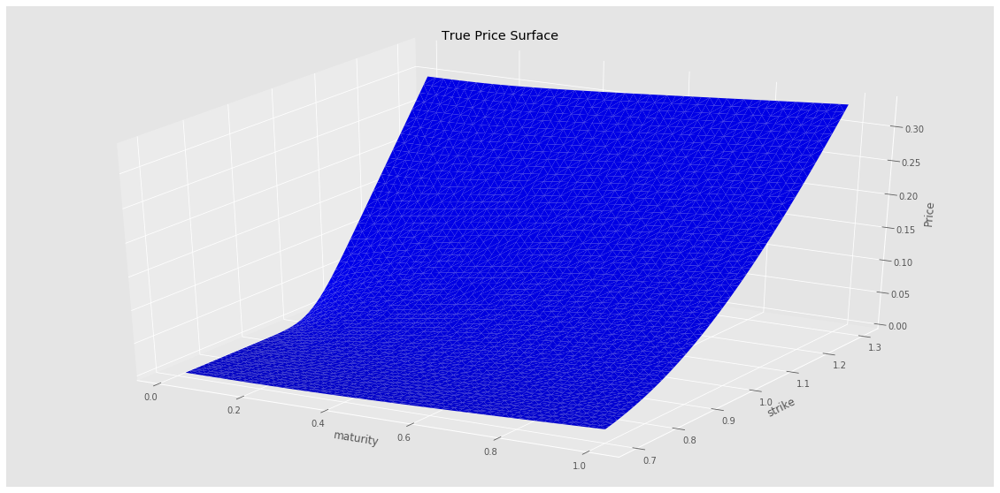

In [58]:
plotSurface(dataSet, "Price", Title = 'True Price Surface')

In [59]:
inverseTransform(scaledDataSet, scaler).head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity
strike,maturity,,,,,,,,,,
0.70,0.02,8.649762e-20,-1.756272e-17,2.122023e-17,2.521318e-17,7.217767e-15,1.591517e-16,0.70,1.0,0.70,0.02
0.71,0.02,1.480212e-18,-2.891866e-16,3.359222e-16,4.093899e-16,1.110633e-13,2.519416e-15,0.71,1.0,0.71,0.02
0.72,0.02,2.188551e-17,-4.110459e-15,4.585911e-15,5.739368e-15,1.474380e-12,3.439433e-14,0.72,1.0,0.72,0.02
0.73,0.02,2.811701e-16,-5.071900e-14,5.429034e-14,6.986324e-14,1.697953e-11,4.071776e-13,0.73,1.0,0.73,0.02
0.74,0.02,3.156003e-15,-5.462204e-13,5.603318e-13,7.424006e-13,1.705417e-10,4.202488e-12,0.74,1.0,0.74,0.02


In [0]:
def predictionDiagnosis(predValue, refValue, quantityName):
  title = "Interpolated " + quantityName + " surface"
  plotSerie(predValue.rename(quantityName),Title = title)
  
  title = "True " + quantityName + " surface"
  plotSerie(refValue.rename(quantityName),Title = title)
  
  title = quantityName + " surface error"
  plotSerie(np.abs(predValue - refValue).rename(quantityName + " Error"),
            Title = title)
  
  return

  
def modelSummary(price, volLocale, delta_T, gamma_K):
  priceRef = dataSet["Price"]
  predictionDiagnosis(price, priceRef, "Price")
  
  volLocaleRef = pd.Series(sigma * np.ones_like(volLocale), 
                           index=dataSet.index)
  predictionDiagnosis(volLocale, volLocaleRef, "local volatility")
  
  dTRef = dataSet["Theta"]
  predictionDiagnosis(delta_T, dTRef, "Theta")
  
  gKRef = dataSet["Gamma Strike"]
  predictionDiagnosis(gamma_K, gKRef, "Gamma Strike")
  return
  

## Learning Price

### Convex architecture

In [0]:
#tf.reset_default_graph()
#Neural network architecture
def positiveKernelInitializer(shape, 
                              dtype=None, 
                              partition_info=None):
  return tf.abs(tf.keras.initializers.normal()(shape,dtype=dtype, partition_info=partition_info))

#Neural network architecture
def convexLayer(n_units, tensor, isTraining, name, isNonDecreasing = True):
  with tf.name_scope(name):
    layer = tf.layers.dense(tensor if isNonDecreasing else (- tensor), 
                            units=n_units,
                            #input_dim= n_input, 
                            kernel_constraint = tf.keras.constraints.NonNeg(), 
                            kernel_initializer=positiveKernelInitializer)
    return K.softplus(layer)

def monotonicLayer(n_units,  tensor, isTraining, name):
  with tf.name_scope(name):
    layer = tf.layers.dense(tensor, 
                            units=n_units,
                            #input_dim=n_input, 
                            kernel_constraint = tf.keras.constraints.NonNeg(), 
                            kernel_initializer=positiveKernelInitializer)
    return K.sigmoid(layer)

def convexOutputLayer(tensor, isTraining, name, isNonDecreasing = True):
  with tf.name_scope(name):
    layer = tf.layers.dense(tensor if isNonDecreasing else (- tensor), 
                            units=1,
                            #input_dim=n_input, 
                            kernel_constraint = tf.keras.constraints.NonNeg(), 
                            kernel_initializer=positiveKernelInitializer)
    return K.softplus(layer)




  
def NNArchitecture(n_units, strikeTensor,maturityTensor, IsTraining=True):
  
  #x = [strikeTensor, maturityTensor]
  hidden1S = convexLayer(n_units = n_units,
                         #n_input = 1, 
                         #tensor=strikeTensor, 
                         tensor = strikeTensor,
                         isTraining=IsTraining, 
                         name = "Hidden1S")
  
  hidden1M = monotonicLayer(n_units = n_units,
                            #n_input = 1, 
                            tensor = maturityTensor, 
                            isTraining = IsTraining, 
                            name = "Hidden1M")
  
  hidden1 = tf.concat([hidden1S, hidden1M], axis=-1)
  

  out = convexOutputLayer(tensor = hidden1,
                        isTraining = IsTraining, 
                        name = "Output")
  
  return out

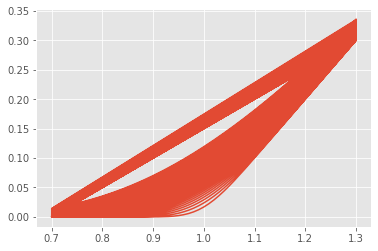

In [62]:
plt.plot(dataSet.index.get_level_values("strike"), dataSet["Price"])

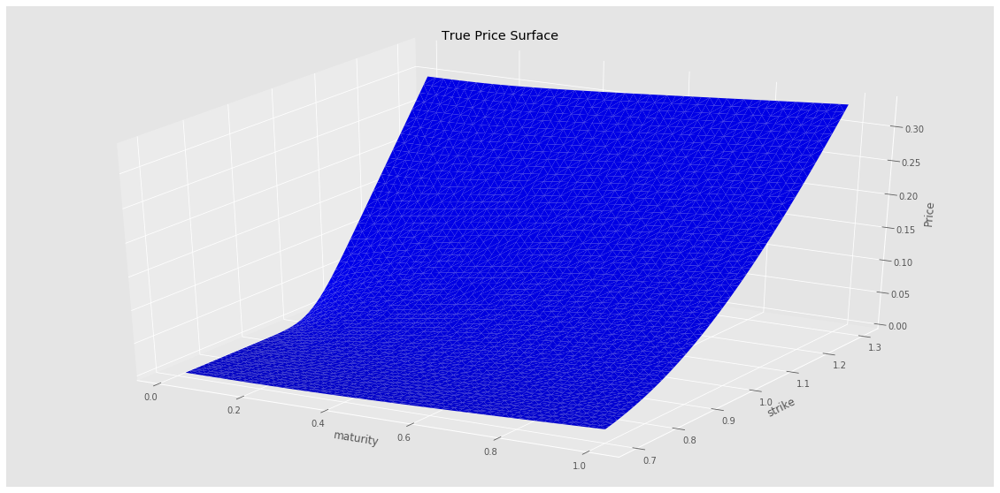

In [63]:
plotSurface(dataSet, "Price", Title = 'True Price Surface')

In [0]:
def create_train_model(hidden_nodes, num_iters, NNFactory, dataSet):

    # Reset the graph
    tf.reset_default_graph()
    
    # Placeholders for input and output data   
    Strike = tf.placeholder(tf.float32,[None,1])
    Maturity = tf.placeholder(tf.float32,[None,1])
    factorPrice = tf.placeholder(tf.float32,[None,1])
    y = tf.placeholder(shape=(None, 1), dtype=tf.float32, name='y')
    
    y_est= NNFactory(hidden_nodes, Strike, Maturity) # one hidden layer
    y_est_sc= tf.multiply(factorPrice,y_est)
    # Define a loss function
    errors = tf.square(y_est_sc - y)
    loss = tf.sqrt(tf.reduce_mean(errors))

    # Define a train operation to minimize the loss
    optimizer = tf.train.AdamOptimizer()
    train = optimizer.minimize(loss)

    # Initialize variables and run session
    init = tf.global_variables_initializer()
    saver = tf.train.Saver()
    sess = tf.Session()
    sess.run(init)
    n = dataSet.shape[0]
    # Go through num_iters iterations (ignoring mini-batching)
    strike = dataSet["Strike"].values.reshape(n,1)
    maturity = dataSet["Maturity"].values.reshape(n,1)

    loss_serie = []
    patience = 100
    for i in range(num_iters):
        sess.run(train, feed_dict={Strike: dataSet["ChangedStrike"].values.reshape(n,1), 
                                   Maturity: maturity, 
                                   y: dataSet["Price"].values.reshape(n,1), 
                                   factorPrice : dataSet["DividendFactor"].values.reshape(n,1)})
        loss_serie.append(sess.run(loss, feed_dict={Strike: dataSet["ChangedStrike"].values.reshape(n,1),
                                                    Maturity: maturity,
                                                    y: dataSet["Price"].values.reshape(n,1),
                                                    factorPrice : dataSet["DividendFactor"].values.reshape(n,1)}))
        if (len(loss_serie) < 2) or (loss_serie[-1] < min(loss_serie[:-1])):
          #Save model as model is improved
          saver.save(sess, 'bestModel')
        if min(loss_serie[-patience:]) > min(loss_serie) :
          #No improvement for training loss during the latest 100 iterations
          break
    saver.restore(sess, 'bestModel')
    y_est_sc_=sess.run(y_est_sc, feed_dict={Strike: dataSet["ChangedStrike"].values.reshape(n,1), 
                                            Maturity: maturity, 
                                            y: dataSet["Price"].values.reshape(n,1), 
                                            factorPrice : dataSet["DividendFactor"].values.reshape(n,1)})
    print("loss (hidden nodes: %d, iterations: %d): %.2f" % (hidden_nodes, num_iters, loss_serie[-1]))
    sess.close()
    scaledPredPrice = pd.Series(y_est_sc_.flatten(), index = dataSet.index).rename("Price") #weights1, weights2, bias1, bias2
    return inverseTransformColumn(dataSet, scaler, scaledPredPrice), pd.Series(loss_serie)

In [65]:
n_units = 50# keys are number of hidden units
n_epoch = 100000
y_pred, lossSerie = create_train_model(n_units, n_epoch, NNArchitecture, scaledDataSet)

Instructions for updating:
Use keras.layers.Dense instead.
Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
INFO:tensorflow:Restoring parameters from bestModel
loss (hidden nodes: 50, iterations: 100000): 0.00


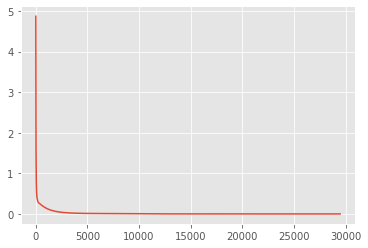

In [66]:
plt.plot(lossSerie)

In [67]:
lossSerie.iloc[-1]

0.0002909534960053861

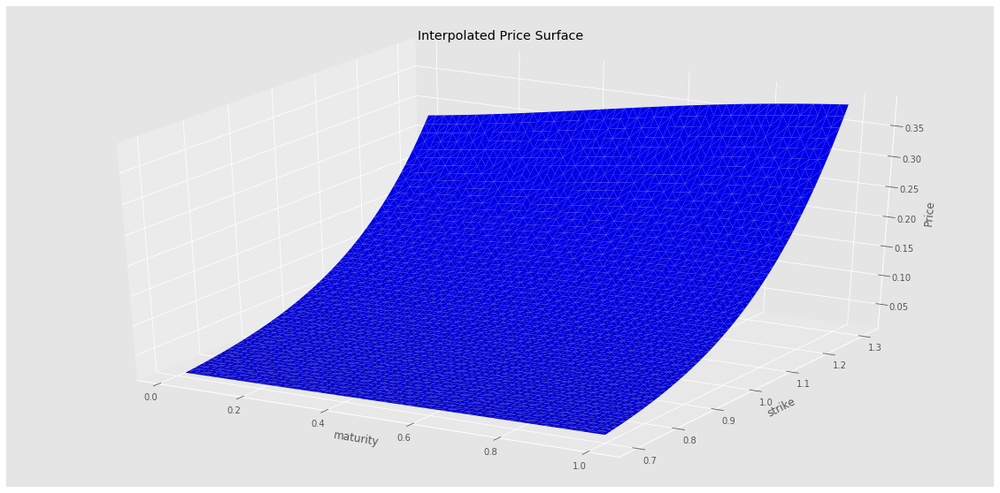

In [68]:
plotSerie(y_pred, Title = 'Interpolated Price Surface')

In [69]:
y_pred.head()

strike  maturity
0.70    0.02        0.014778
0.71    0.02        0.015539
0.72    0.02        0.016341
0.73    0.02        0.017186
0.74    0.02        0.018075
Name: Price, dtype: float32

In [70]:
y_pred.loc[(S0,slice(None))].head()

maturity
0.0200    0.067171
0.0396    0.067656
0.0592    0.068155
0.0788    0.068667
0.0984    0.069192
Name: Price, dtype: float32

In [71]:
dataSet["Price"].head()

strike  maturity
0.70    0.02        8.649762e-20
0.71    0.02        1.480212e-18
0.72    0.02        2.188551e-17
0.73    0.02        2.811701e-16
0.74    0.02        3.156003e-15
Name: Price, dtype: float64

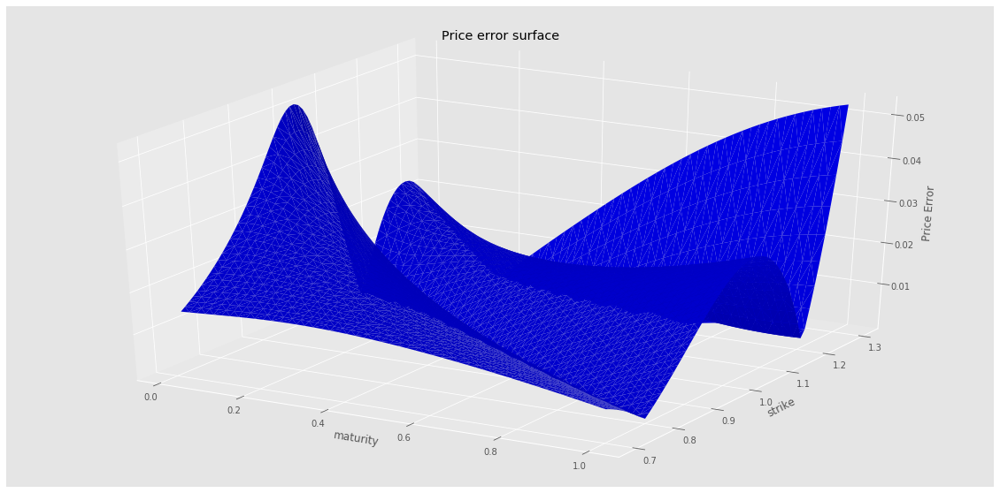

In [72]:
# Compute z to make the pringle surface.
z = np.abs(y_pred-dataSet["Price"]).rename('Price Error')
plotSerie(z, Title = 'Price error surface')

### Unconstrained neural network

In [0]:
def unconstrainedLayer(n_units,  tensor, isTraining, name, activation = K.softplus):
  with tf.name_scope(name):
    layer = tf.layers.dense(tensor, 
                            units=n_units,
                            activation=activation,  
                            kernel_initializer=tf.keras.initializers.he_normal())
    return layer

def NNArchitecture(n_units, strikeTensor,maturityTensor, IsTraining=True):
  
  #x = [strikeTensor, maturityTensor]
  
  inputLayer = tf.concat([strikeTensor,maturityTensor], axis=-1)
    
  hidden1 = unconstrainedLayer(n_units = n_units,
                               #n_input = 1, 
                               #tensor=strikeTensor, 
                               tensor = inputLayer,
                               isTraining=IsTraining, 
                               name = "Hidden1")

  out = unconstrainedLayer(n_units = 1,
                           tensor = hidden1,
                           isTraining=IsTraining, 
                           name = "Output",
                           activation = None)
  
  return out


In [74]:
n_units = 100  # keys are number of hidden units
n_epoch = 100000
y_pred, lossSerie=create_train_model(n_units, n_epoch, NNArchitecture, scaledDataSet)

INFO:tensorflow:Restoring parameters from bestModel
loss (hidden nodes: 100, iterations: 100000): 0.00


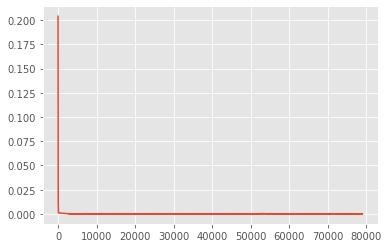

In [75]:
plt.plot(lossSerie)

In [76]:
lossSerie.iloc[-1]

1.2224485544720665e-05

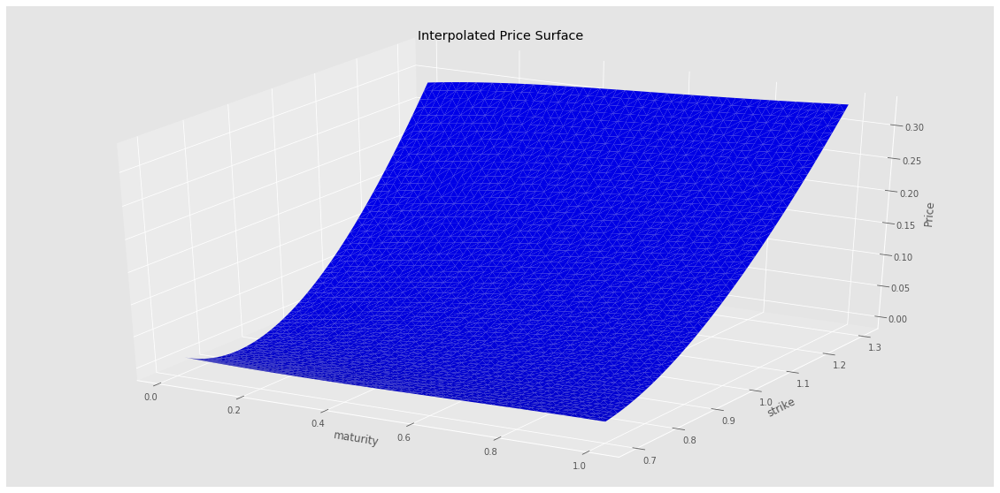

In [77]:
plotSerie(y_pred, Title = 'Interpolated Price Surface')

In [78]:
y_pred.head()

strike  maturity
0.70    0.02        0.012287
0.71    0.02        0.008187
0.72    0.02        0.004477
0.73    0.02        0.001153
0.74    0.02       -0.001790
Name: Price, dtype: float32

In [79]:
y_pred.loc[(S0,slice(None))].head()

maturity
0.0200    0.038375
0.0396    0.040656
0.0592    0.042889
0.0788    0.045073
0.0984    0.047211
Name: Price, dtype: float32

In [80]:
dataSet["Price"].head()

strike  maturity
0.70    0.02        8.649762e-20
0.71    0.02        1.480212e-18
0.72    0.02        2.188551e-17
0.73    0.02        2.811701e-16
0.74    0.02        3.156003e-15
Name: Price, dtype: float64

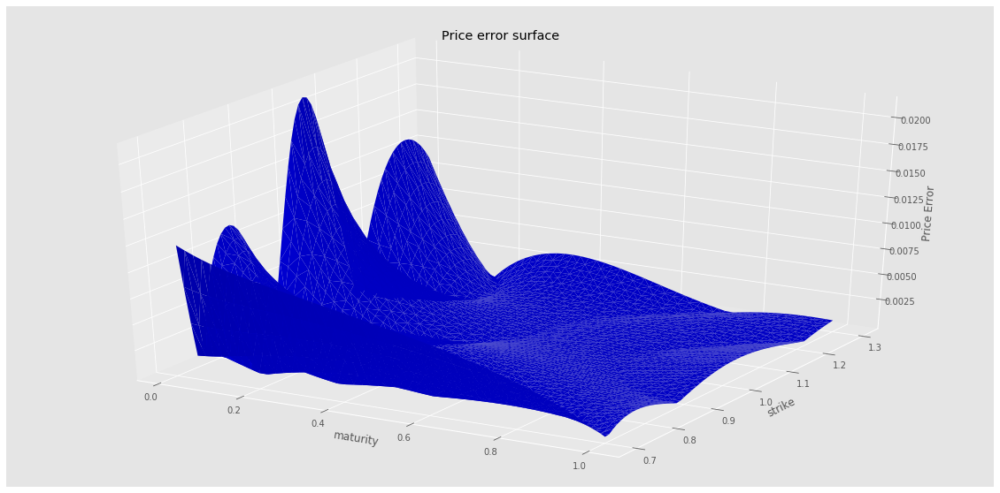

In [81]:
# Compute z to make the pringle surface.
z = np.abs(y_pred-dataSet["Price"]).rename('Price Error')
plotSerie(z, Title = 'Price error surface')

## Dupire formula implementation

### Convex architecture

In [0]:
#tf.reset_default_graph()
#Neural network architecture
def positiveKernelInitializer(shape, 
                              dtype=None, 
                              partition_info=None):
  return tf.abs(tf.keras.initializers.normal()(shape,dtype=dtype, partition_info=partition_info))

#Neural network architecture
def convexLayer(n_units, 
                tensor, 
                isTraining, 
                name, 
                activationFunction = Act.softplus, 
                isNonDecreasing = True):
  with tf.name_scope(name):
    layer = tf.layers.dense(tensor if isNonDecreasing else (- tensor), 
                            units=n_units,
                            #input_dim= n_input, 
                            kernel_constraint = tf.keras.constraints.NonNeg(), 
                            kernel_initializer=positiveKernelInitializer)
    return activationFunction(layer), layer

def monotonicLayer(n_units,  tensor, isTraining, name):
  with tf.name_scope(name):
    layer = tf.layers.dense(tensor, 
                            units=n_units,
                            #input_dim=n_input, 
                            kernel_constraint = tf.keras.constraints.NonNeg(), 
                            kernel_initializer=positiveKernelInitializer)
    return K.sigmoid(layer), layer

def convexOutputLayer(tensor, isTraining, name, isNonDecreasing = True):
  with tf.name_scope(name):
    layer = tf.layers.dense(tensor if isNonDecreasing else (- tensor), 
                            units=1,
                            #input_dim=n_input, 
                            kernel_constraint = tf.keras.constraints.NonNeg(), 
                            kernel_initializer=positiveKernelInitializer)
    return K.softplus(layer), layer
  

def convexLayerHybrid(n_units, 
                      tensor, 
                      isTraining, 
                      name, 
                      activationFunction2 = Act.softplus,
                      activationFunction1 = Act.exponential,
                      isNonDecreasing = True):
  with tf.name_scope(name):
    layer = tf.layers.dense(tensor if isNonDecreasing else (- tensor), 
                            units=n_units,
                            #input_dim= n_input, 
                            kernel_constraint = tf.keras.constraints.NonNeg(), 
                            kernel_initializer=positiveKernelInitializer)
    l1,l2 = tf.split(layer,2,1)
    output = tf.concat([activationFunction1(l1),activationFunction2(l2)],axis=-1)
    return output , layer

def sigmoidGradient(inputTensor):
  return tf.nn.sigmoid(inputTensor) * ( 1 - tf.nn.sigmoid(inputTensor) )

def sigmoidHessian(inputTensor) :
  return (tf.square(1 - tf.nn.sigmoid(inputTensor)) -
          tf.nn.sigmoid(inputTensor) * (1 - tf.nn.sigmoid(inputTensor)))
  

  
def hessianAndGradientTensor(layers, Strike, Maturity):

    w1S = tf.get_default_graph().get_tensor_by_name( 'dense/kernel:0')
    w1T = tf.get_default_graph().get_tensor_by_name( 'dense_1/kernel:0')
    w2 = tf.get_default_graph().get_tensor_by_name( 'dense_2/kernel:0')
    w3 = tf.get_default_graph().get_tensor_by_name( 'dense_3/kernel:0')
    
    b1S = tf.get_default_graph().get_tensor_by_name( 'dense/bias:0')
    b1T = tf.get_default_graph().get_tensor_by_name( 'dense_1/bias:0')
    b2 = tf.get_default_graph().get_tensor_by_name( 'dense_2/bias:0')
    b3 = tf.get_default_graph().get_tensor_by_name( 'dense_3/bias:0')
    
    nBatches = int(Strike.get_shape()[1])
    
    #Gradient analytic differentiation
    w2S, w2T = tf.split(w2, 2, 0)
    
    print("w2S", (w2S))
    print("w2T", (w2T))
    print("w2", (w2))
    print("Strike", Strike)
    
    dL1S = tf.nn.sigmoid(layers[0]) * w1S
    print("w1S", (w1S))
    print("f0", (tf.nn.sigmoid(layers[0])))
    print("dL1S", (dL1S))
    
    dL1T = sigmoidGradient(layers[1]) * w1T
    print("w1T", (w1T))
    print("f1", tf.nn.sigmoid(layers[1]))
    print("dL1T", (dL1T))
    
    s1S,s2S = tf.split(layers[2],2,1)
    dc2 = tf.concat([Act.exponential(s1S),tf.nn.sigmoid(s2S)],axis=-1)
    dL2S = dc2 * tf.matmul(tf.concat([dL1S,dL1T*0],axis=-1), w2, transpose_a = False, transpose_b = False)
    print("dL2S", dL2S)
    
    dL2T = dc2 * tf.matmul(tf.concat([dL1S*0,dL1T],axis=-1), w2, transpose_a = False, transpose_b = False)
    print("dL2T", dL2T)
    
    gradS = tf.matmul(dL2S, w3, transpose_a =False, transpose_b =False)
    print("gradS", (gradS))
    
    gradM = tf.matmul(dL2T, w3, transpose_a =False, transpose_b =False)
    print("gradM", (gradM))
    
    hL1S = tf.square(w1S) * sigmoidGradient(layers[0])
    print("hL1S", (hL1S))
    
    hL1T = tf.square(w1T) * sigmoidHessian(layers[1])
    print("hL1T", (hL1T))
    
    hc2 = tf.concat([Act.exponential(s1S),sigmoidGradient(s2S)],axis=-1)
    hL2S = (hc2 * tf.matmul(tf.concat([dL1S,dL1T*0],axis=-1), tf.square(w2), transpose_a = False, transpose_b = False) + 
            dc2 * tf.matmul(tf.concat([hL1S,hL1T*0],axis=-1), w2, transpose_a = False, transpose_b = False))
    print("hL2S", (hL2S))
    
    hL2T = (hc2 * tf.matmul(tf.concat([dL1S*0,dL1T],axis=-1), tf.square(w2), transpose_a = False, transpose_b = False) + 
            dc2 * tf.matmul(tf.concat([hL1S*0,hL1T],axis=-1), w2, transpose_a = False, transpose_b = False))
    print("hL2T", (hL2T))
    
    hessianS = tf.matmul(hL2S, w3, transpose_a =False, transpose_b =False)
    print("hessianS", (hessianS))
    
    hessianM = tf.matmul(hL2T, w3, transpose_a =False, transpose_b =False)
    print("hessianM", (hessianM))
    
    return gradM, gradS, hessianM, hessianS
  
#activateFunctionDerivative
#for softplus tf.nn.sigmoid
#for sigmoid tf.matmul((tf.ones() - tf.nn.sigmoid), tf.nn.sigmoid)

#hessianActivationFunction
#for softplus tf.matmul((1 - tf.nn.sigmoid), tf.nn.sigmoid)

def dupireFormula(HessianStrike, GradMaturity, Strike):
  twoConstant = tf.constant(2.0)
  dupireVolTensor = tf.math.divide(tf.sqrt(tf.math.divide(tf.math.scalar_mul(twoConstant,GradMaturity), 
                                                          HessianStrike)),
                                   Strike)
  return dupireVolTensor
  
def NNArchitecture(n_units, strikeTensor, maturityTensor, IsTraining=True):
  
  #x = [strikeTensor, maturityTensor]
  hidden1S, layer1S = convexLayer(n_units = n_units,
                                  tensor = strikeTensor,
                                  isTraining=IsTraining, 
                                  name = "Hidden1S")
  
  hidden1M, layer1M = convexLayer(n_units = n_units,
                                  tensor = maturityTensor,
                                  isTraining = IsTraining, 
                                  name = "Hidden1M",
                                  activationFunction = K.sigmoid)
  
  hidden1 = tf.concat([hidden1S, hidden1M], axis=-1)

  hidden2, layer2 = convexLayerHybrid(n_units = n_units,
                                      tensor = hidden1,
                                      isTraining = IsTraining, 
                                      name = "Hidden2")
  
  out, layer3 = convexLayer(n_units = 1,
                            tensor = hidden2,
                            isTraining = IsTraining, 
                            name = "Hidden3",
                            activationFunction = Act.linear)
  
  
  dT, dS, HT, HS = hessianAndGradientTensor([layer1S,layer1M,layer2,layer3],
                                            strikeTensor,
                                            maturityTensor)
  dupireVol = dupireFormula(HS, dT, strikeTensor)
  
  
  return out, dupireVol, dT, HS

In [83]:
tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES)

[<tf.Variable 'dense/kernel:0' shape=(2, 100) dtype=float32_ref>,
 <tf.Variable 'dense/bias:0' shape=(100,) dtype=float32_ref>,
 <tf.Variable 'dense_1/kernel:0' shape=(100, 1) dtype=float32_ref>,
 <tf.Variable 'dense_1/bias:0' shape=(1,) dtype=float32_ref>]

In [0]:
def regularization(localVolatility):
  lowerVolBound = 0.05
  upperVolBound = 0.5
  reg = tf.square(tf.nn.relu(lowerVolBound - localVolatility) + 
                  tf.nn.relu(localVolatility - upperVolBound))
  return reg

def create_train_model_dupire(hidden_nodes, 
                              num_iters, 
                              NNFactory, 
                              dataSet, 
                              activateRegularization):

    # Reset the graph
    tf.reset_default_graph()
    
    # Placeholders for input and output data   
    Strike = tf.placeholder(tf.float32,[None,1])
    Maturity = tf.placeholder(tf.float32,[None,1])
    factorPrice = tf.placeholder(tf.float32,[None,1])
    y = tf.placeholder(shape=(None, 1), dtype=tf.float32, name='y')
    
    y_est, dupireVol, deltaNN_T, gammaNN_K= NNFactory(hidden_nodes, Strike, Maturity) # one hidden layer
    y_est_sc= tf.multiply(factorPrice,y_est)
    
    # Define a loss function
    lambdas = 10000 #To be calibrated
    errors = None
    if activateRegularization : 
        errors = tf.square(y_est_sc - y) + lambdas * regularization(dupireVol)
    else :
        errors = tf.square(y_est_sc - y)
    loss = tf.sqrt(tf.reduce_sum(errors))

    # Define a train operation to minimize the loss
    optimizer = tf.train.AdamOptimizer()
    train = optimizer.minimize(loss)

    # Initialize variables and run session
    init = tf.global_variables_initializer()
    saver = tf.train.Saver()
    sess = tf.Session()
    sess.run(init)
    n = dataSet.shape[0]
    
    # Go through num_iters iterations (ignoring mini-batching)
    strike = dataSet["Strike"].values.reshape(n,1)
    maturity = dataSet["Maturity"].values.reshape(n,1)
    loss_serie = []
    patience = 100
    for i in range(num_iters):
        sess.run(train, feed_dict={Strike : dataSet["ChangedStrike"].values.reshape(n,1), 
                                   Maturity : maturity, 
                                   y : dataSet["Price"].values.reshape(n,1), 
                                   factorPrice : dataSet["DividendFactor"].values.reshape(n,1)})
        loss_serie.append(sess.run(loss, feed_dict={Strike : dataSet["ChangedStrike"].values.reshape(n,1),
                                                    Maturity : maturity,
                                                    y : dataSet["Price"].values.reshape(n,1),
                                                    factorPrice : dataSet["DividendFactor"].values.reshape(n,1)}))
        if (len(loss_serie) < 2) or (loss_serie[-1] < min(loss_serie[:-1])):
          #Save model as model is improved
          saver.save(sess, 'bestModel')
        if min(loss_serie[-patience:]) > min(loss_serie) :
          #No improvement for training loss during the latest 100 iterations
          break
    saver.restore(sess, 'bestModel')  
    y_est_sc_, dupireVolEval, deltaNN_TEval, gammaNN_KEval  = sess.run([y_est_sc, dupireVol, deltaNN_T, gammaNN_K], 
                                                                       feed_dict={Strike : dataSet["ChangedStrike"].values.reshape(n,1), 
                                                                                  Maturity : maturity, 
                                                                                  y : dataSet["Price"].values.reshape(n,1), 
                                                                                  factorPrice : dataSet["DividendFactor"].values.reshape(n,1)})
    #[y_est_sc, dupireVol]
    
    print("loss (hidden nodes: %d, iterations: %d): %.2f" % (hidden_nodes, num_iters, loss_serie[-1]))
    sess.close()

    scaledPredPrice = pd.Series(y_est_sc_.flatten(), index = dataSet.index).rename("Price")
    predPrice = inverseTransformColumn(dataSet, scaler, scaledPredPrice)
    
    predDupire = pd.Series(dupireVolEval.flatten(), index = dataSet.index).rename("Dupire")
    
    scaledTheta = pd.Series(deltaNN_TEval.flatten(), index = dataSet.index).rename("Theta")
    predTheta = inverseTransformColumnGreeks(dataSet, scaler, scaledTheta, 
                                             "Price", "Maturity")
    
    scaledGammaK = pd.Series(gammaNN_KEval.flatten(), index = dataSet.index).rename("GammaK")
    predGammaK = inverseTransformColumnGreeks(dataSet, scaler, scaledGammaK, 
                                              "Price", "ChangedStrike", order = 2)
    
    return predPrice , predDupire, predTheta, predGammaK, pd.Series(loss_serie)

In [85]:
n_units = 50  # keys are number of hidden units
n_epoch = 100000
y_pred, volLocale, dNN_T, gNN_K, lossSerie = create_train_model_dupire(n_units, n_epoch,
                                                                       NNArchitecture,
                                                                       scaledDataSet,
                                                                       False)

w2S Tensor("split:0", shape=(50, 50), dtype=float32)
w2T Tensor("split:1", shape=(50, 50), dtype=float32)
w2 Tensor("dense_2/kernel:0", shape=(100, 50), dtype=float32_ref)
Strike Tensor("Placeholder:0", shape=(?, 1), dtype=float32)
w1S Tensor("dense/kernel:0", shape=(1, 50), dtype=float32_ref)
f0 Tensor("Sigmoid_1:0", shape=(?, 50), dtype=float32)
dL1S Tensor("mul:0", shape=(?, 50), dtype=float32)
w1T Tensor("dense_1/kernel:0", shape=(1, 50), dtype=float32_ref)
f1 Tensor("Sigmoid_4:0", shape=(?, 50), dtype=float32)
dL1T Tensor("mul_2:0", shape=(?, 50), dtype=float32)
dL2S Tensor("mul_4:0", shape=(?, 50), dtype=float32)
dL2T Tensor("mul_6:0", shape=(?, 50), dtype=float32)
gradS Tensor("MatMul_2:0", shape=(?, 1), dtype=float32)
gradM Tensor("MatMul_3:0", shape=(?, 1), dtype=float32)
hL1S Tensor("mul_8:0", shape=(?, 50), dtype=float32)
hL1T Tensor("mul_10:0", shape=(?, 50), dtype=float32)
hL2S Tensor("add:0", shape=(?, 50), dtype=float32)
hL2T Tensor("add_1:0", shape=(?, 50), dtype=float3

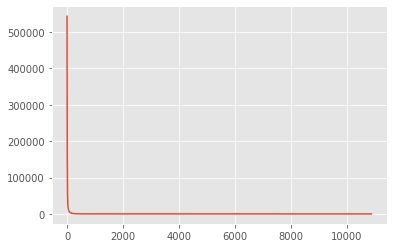

In [86]:
plt.plot(lossSerie)

In [87]:
lossSerie.iloc[-1]

1.2744050025939941

In [88]:
volLocale.loc[(S0,slice(None))]

maturity
0.0200    0.561119
0.0396    0.561131
0.0592    0.561141
0.0788    0.561148
0.0984    0.561153
0.1180    0.561156
0.1376    0.561156
0.1572    0.561154
0.1768    0.561150
0.1964    0.561144
0.2160    0.561134
0.2356    0.561123
0.2552    0.561109
0.2748    0.561093
0.2944    0.561075
0.3140    0.561054
0.3336    0.561031
0.3532    0.561006
0.3728    0.560978
0.3924    0.560948
0.4120    0.560916
0.4316    0.560881
0.4512    0.560844
0.4708    0.560805
0.4904    0.560763
0.5100    0.560719
0.5296    0.560673
0.5492    0.560624
0.5688    0.560573
0.5884    0.560520
0.6080    0.560464
0.6276    0.560406
0.6472    0.560346
0.6668    0.560283
0.6864    0.560218
0.7060    0.560151
0.7256    0.560082
0.7452    0.560010
0.7648    0.559936
0.7844    0.559859
0.8040    0.559781
0.8236    0.559699
0.8432    0.559616
0.8628    0.559530
0.8824    0.559442
0.9020    0.559352
0.9216    0.559260
0.9412    0.559165
0.9608    0.559068
0.9804    0.558969
1.0000    0.558867
Name: Dupire, dtype: f

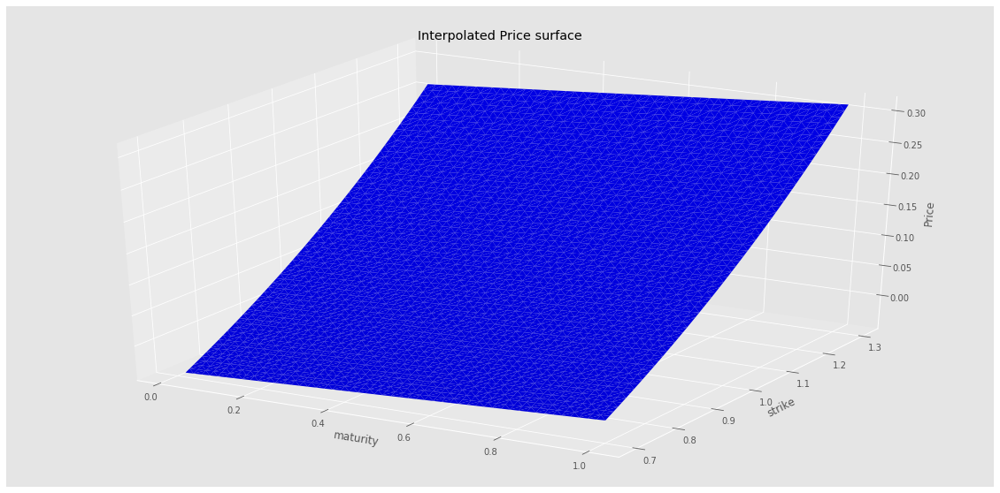

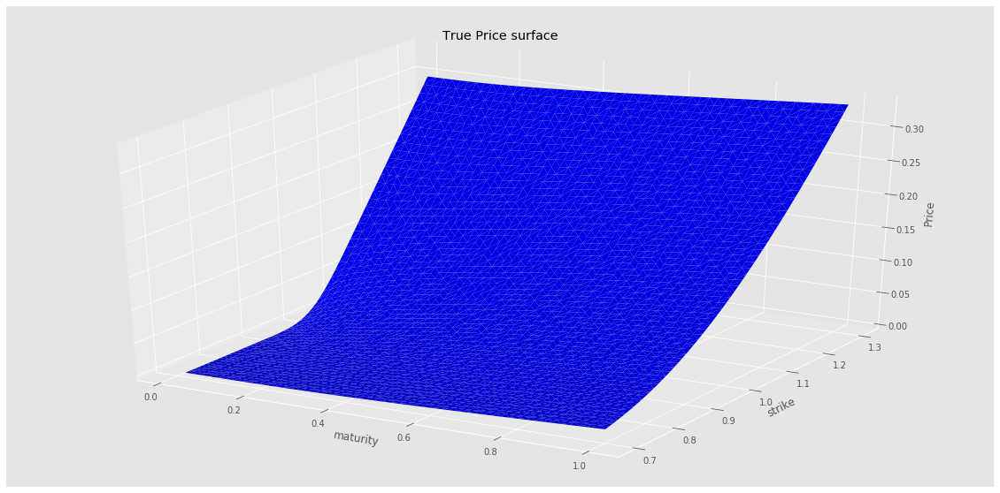

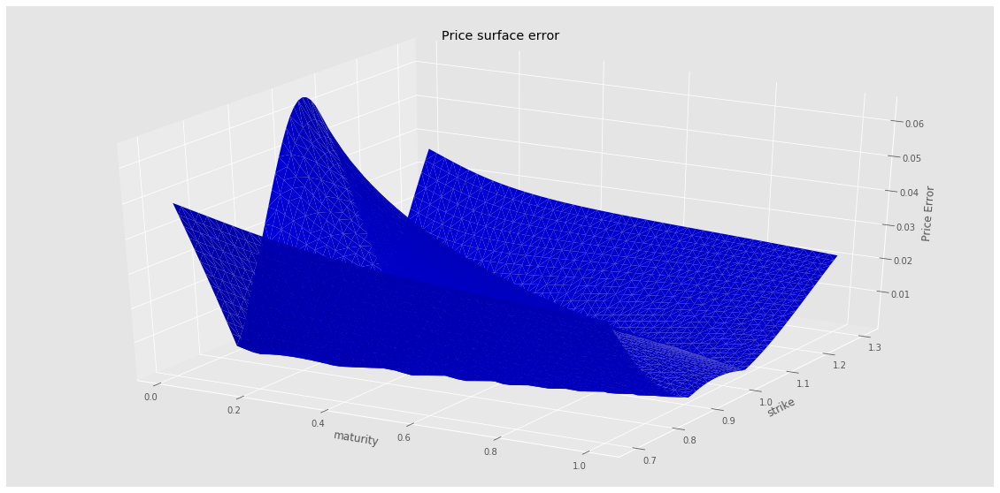

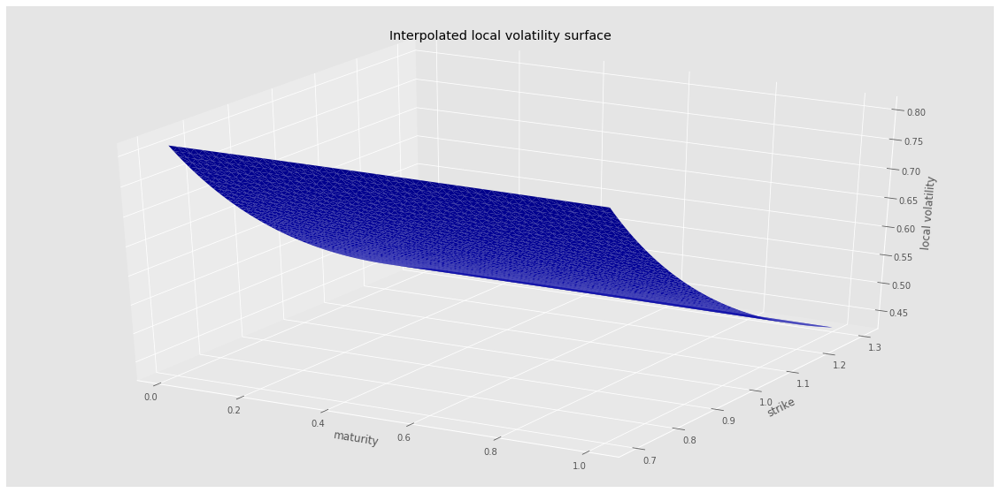

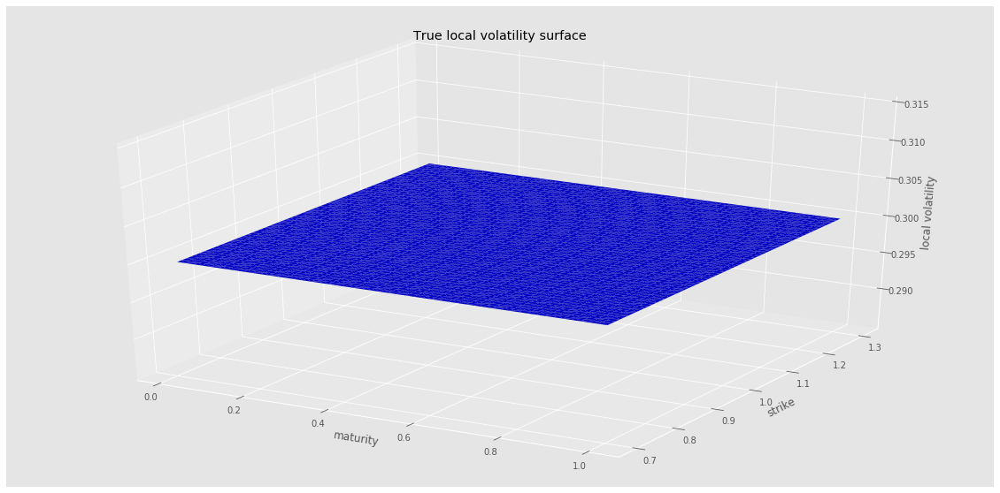

...

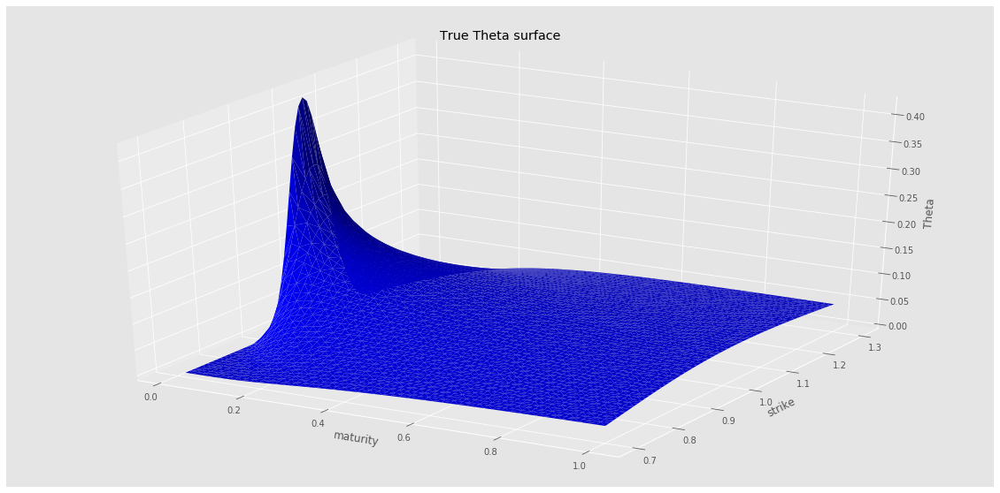

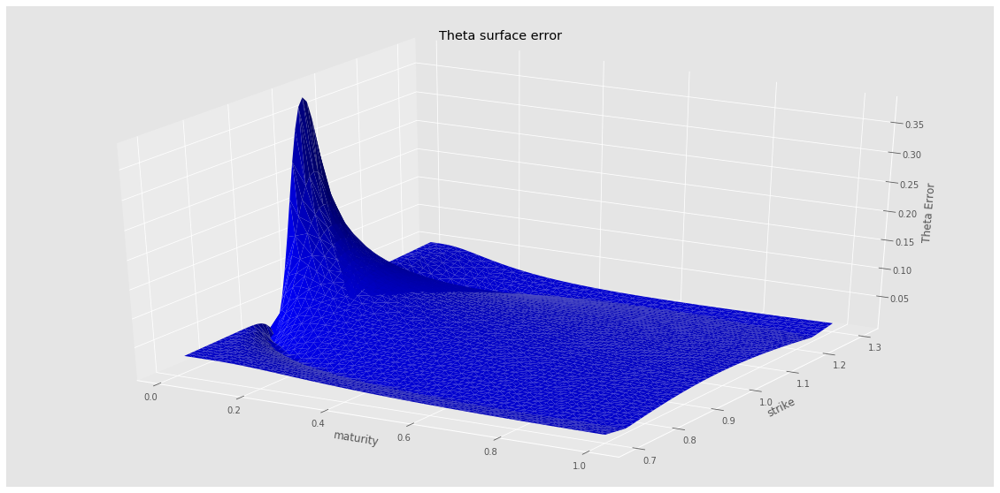

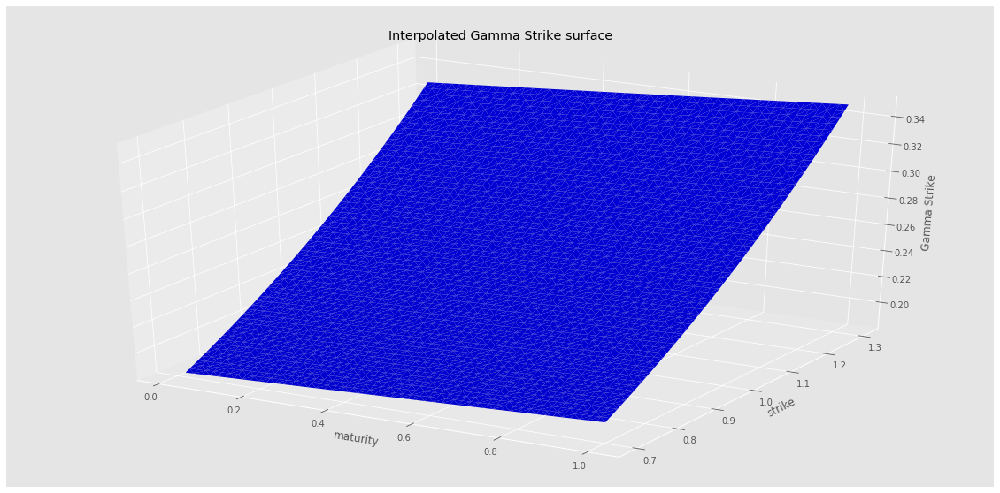

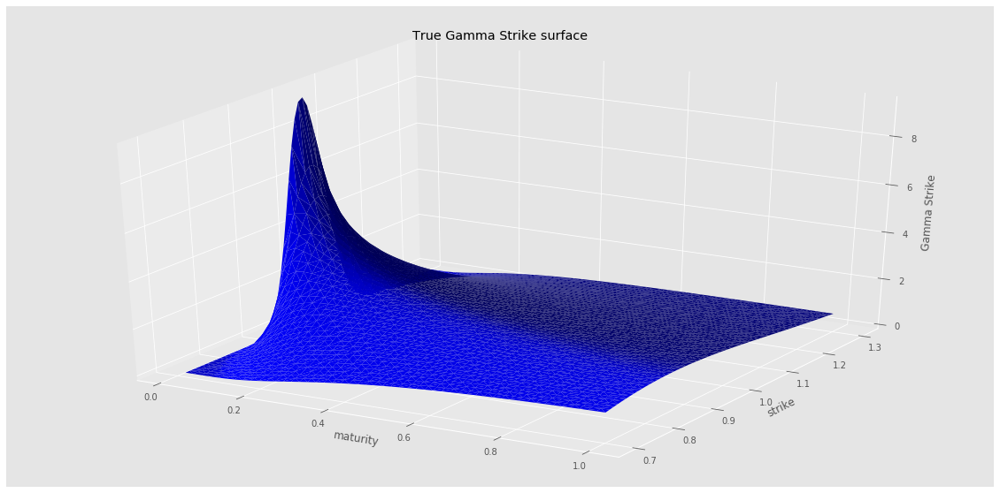

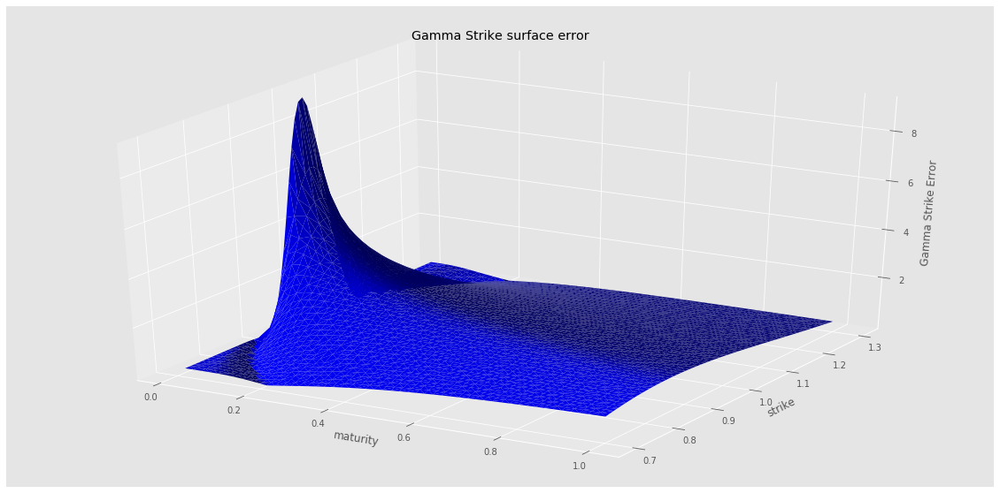

In [89]:
modelSummary(y_pred, volLocale, dNN_T, gNN_K)

### Unconstrained version

In [0]:

def rawDupireFormula(priceTensor, adjustedStrikeTensor, maturityTensor):
  batchSize = tf.shape(adjustedStrikeTensor)[0]
  dK = tf.reshape(tf.gradients(priceTensor, adjustedStrikeTensor, name="dK"), shape=[batchSize,-1])
  hK = tf.reshape(tf.gradients(dK, adjustedStrikeTensor, name="hK"), shape=[batchSize,-1])
  dupireDenominator = tf.square(adjustedStrikeTensor) * hK

  dT = tf.reshape(tf.gradients(priceTensor,maturityTensor,name="dT"), shape=[batchSize,-1])

  dupireVol = tf.sqrt(2 * dT / dupireDenominator)
  return  dupireVol, dT, hK


def NNArchitectureUnconstrained(n_units, strikeTensor,maturityTensor, IsTraining=True):
  
  #x = [strikeTensor, maturityTensor]
  
  inputLayer = tf.concat([strikeTensor,maturityTensor], axis=-1)
    
  hidden1 = unconstrainedLayer(n_units = n_units,
                               #n_input = 1, 
                               #tensor=strikeTensor, 
                               tensor = inputLayer,
                               isTraining=IsTraining, 
                               name = "Hidden1")

  out = unconstrainedLayer(n_units = 1,
                           tensor = hidden1,
                           isTraining=IsTraining, 
                           name = "Output",
                           activation = None)
  
  dupireVol, theta, hK = rawDupireFormula(out, strikeTensor, maturityTensor)
  
  return out, dupireVol, theta, hK


In [91]:
n_units = 100  # keys are number of hidden units
n_epoch = 100000
y_pred, volLocale, dNN_T, gNN_K, lossSerie=create_train_model_dupire(n_units, n_epoch,
                                                                     NNArchitectureUnconstrained,
                                                                     scaledDataSet,
                                                                     False)

INFO:tensorflow:Restoring parameters from bestModel
loss (hidden nodes: 100, iterations: 100000): 0.04


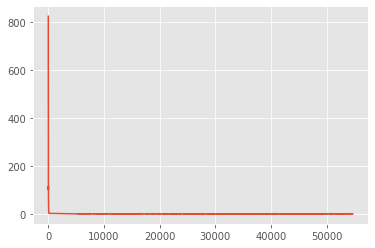

In [92]:
plt.plot(lossSerie)

In [93]:
lossSerie.iloc[-1]

0.04225863143801689

In [94]:
volLocale.loc[(S0,slice(None))]

maturity
0.0200    0.312635
0.0396    0.310270
0.0592    0.308036
0.0788    0.305944
0.0984    0.304001
0.1180    0.302217
0.1376    0.300599
0.1572    0.299151
0.1768    0.297881
0.1964    0.296793
0.2160    0.295889
0.2356    0.295170
0.2552    0.294638
0.2748    0.294292
0.2944    0.294129
0.3140    0.294147
0.3336    0.294340
0.3532    0.294703
0.3728    0.295228
0.3924    0.295909
0.4120    0.296734
0.4316    0.297696
0.4512    0.298781
0.4708    0.299981
0.4904    0.301281
0.5100    0.302669
0.5296    0.304133
0.5492    0.305658
0.5688    0.307230
0.5884    0.308835
0.6080    0.310460
0.6276    0.312089
0.6472    0.313709
0.6668    0.315304
0.6864    0.316861
0.7060    0.318365
0.7256    0.319803
0.7452    0.321161
0.7648    0.322425
0.7844    0.323582
0.8040    0.324618
0.8236    0.325521
0.8432    0.326280
0.8628    0.326880
0.8824    0.327311
0.9020    0.327561
0.9216    0.327618
0.9412    0.327473
0.9608    0.327114
0.9804    0.326532
1.0000    0.325716
Name: Dupire, dtype: f

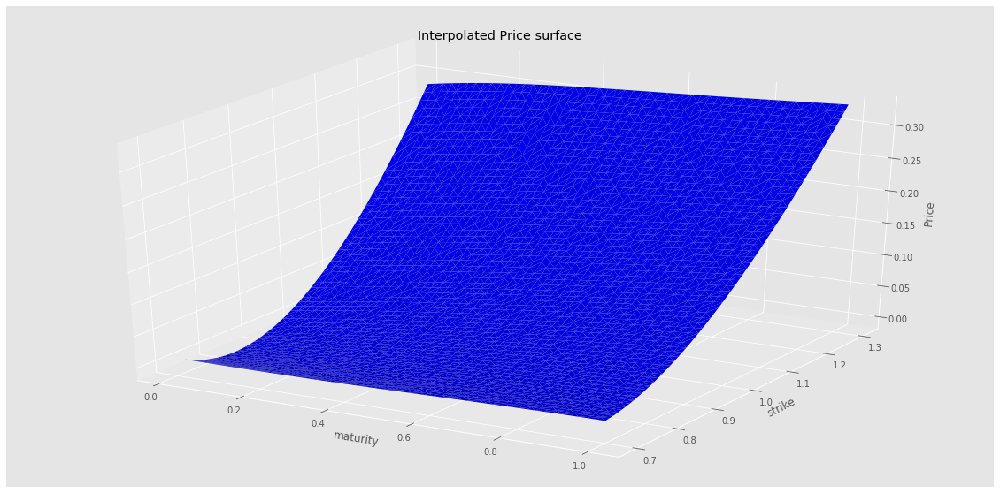

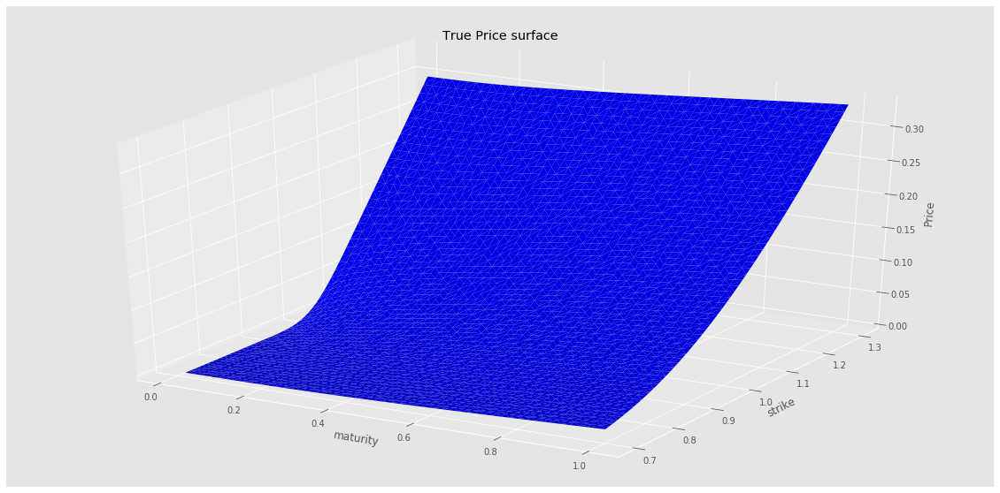

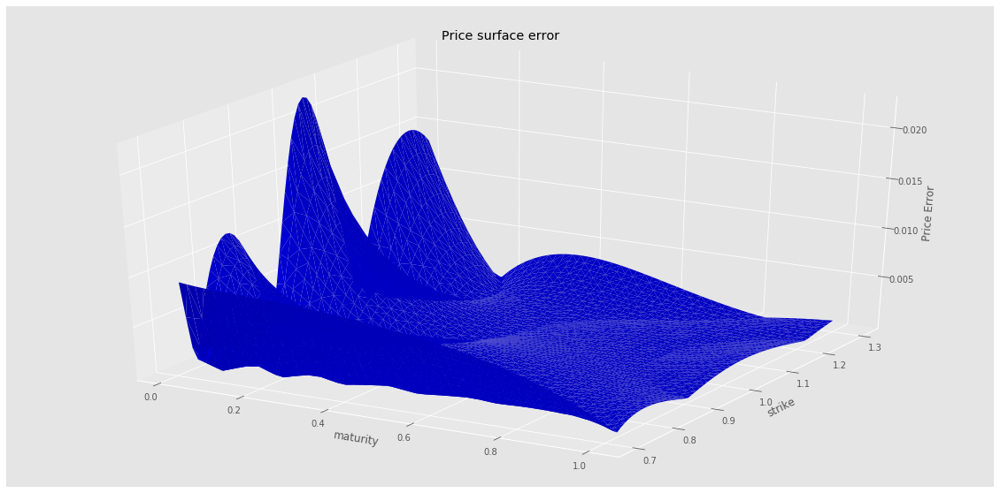

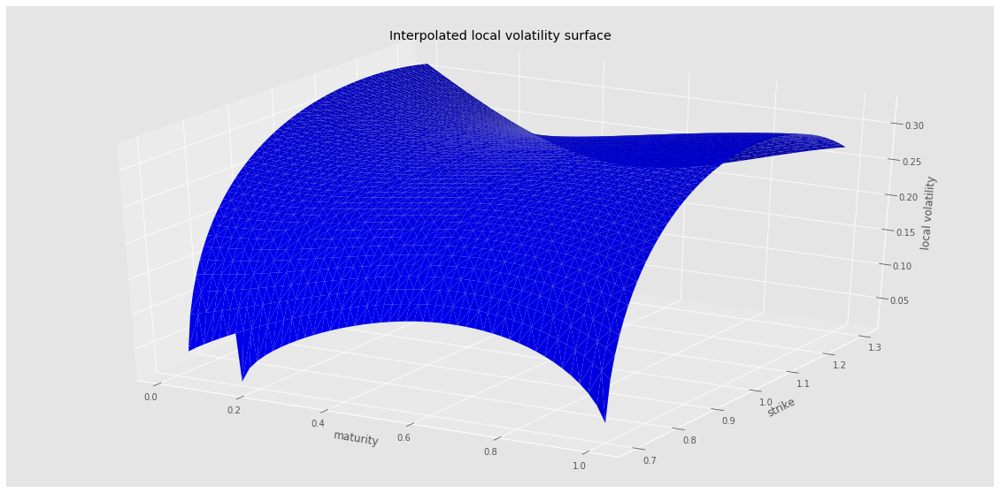

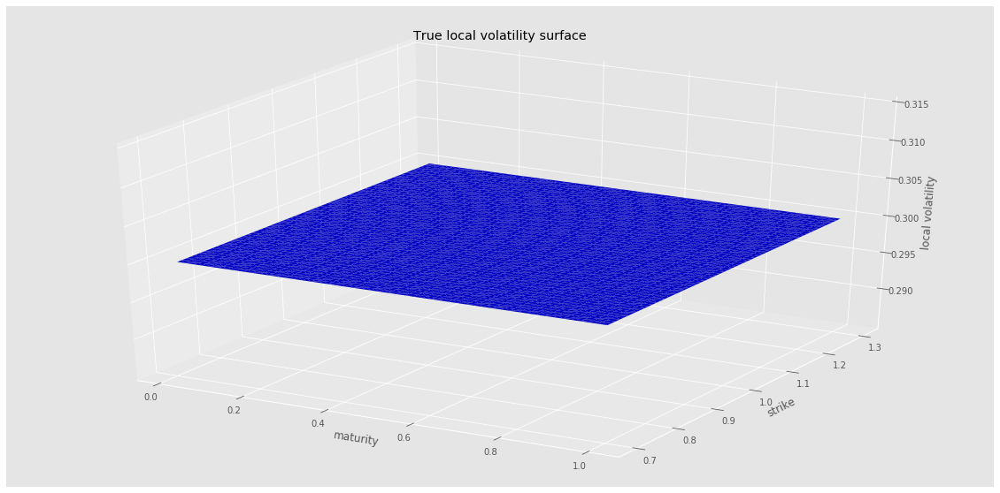

...

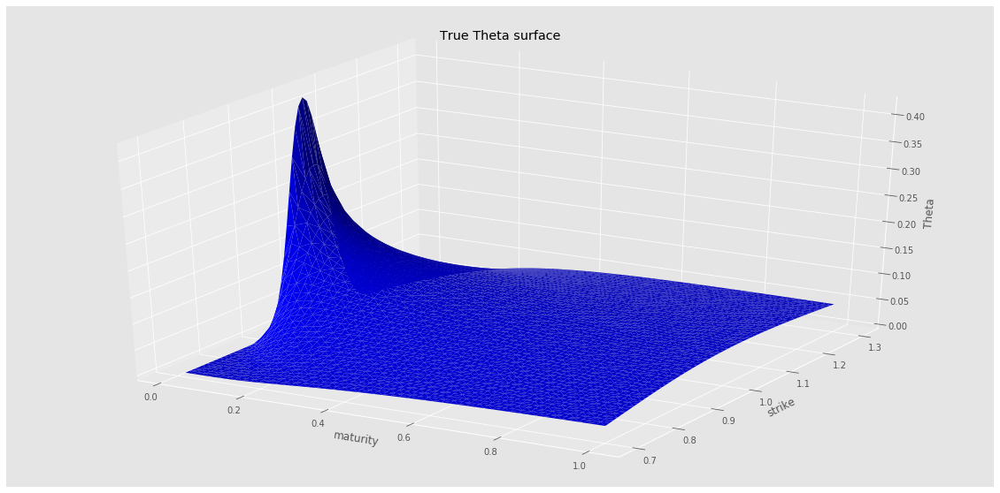

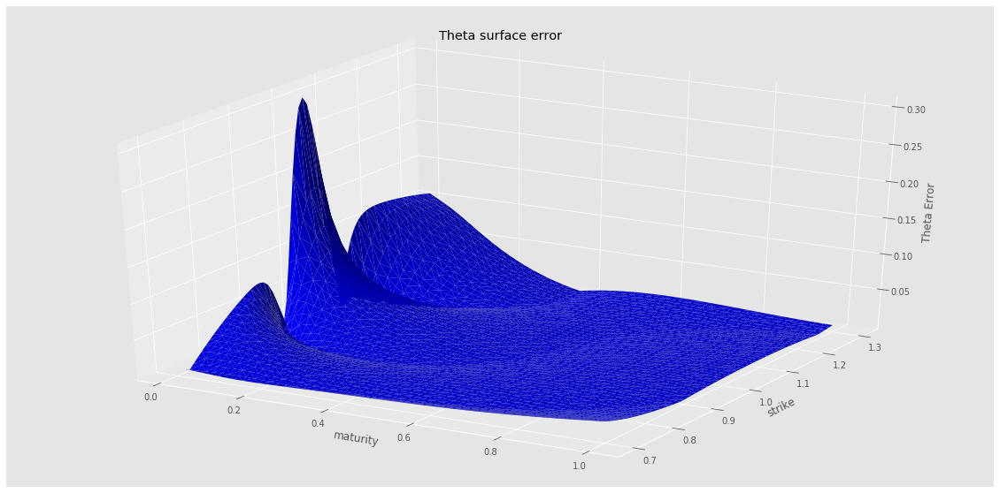

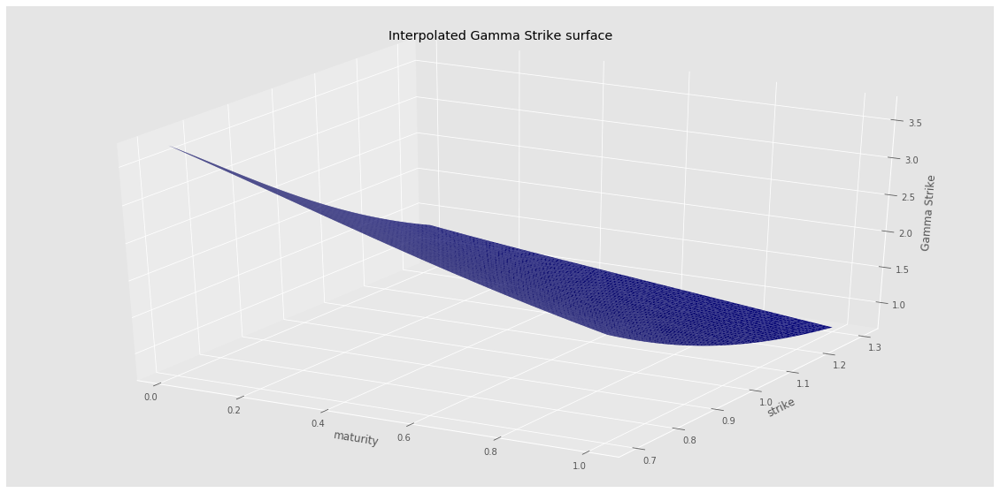

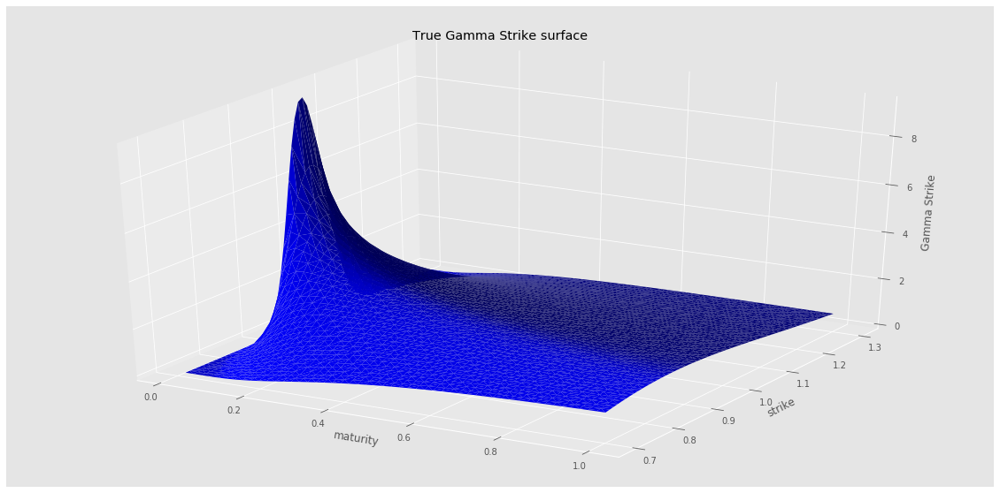

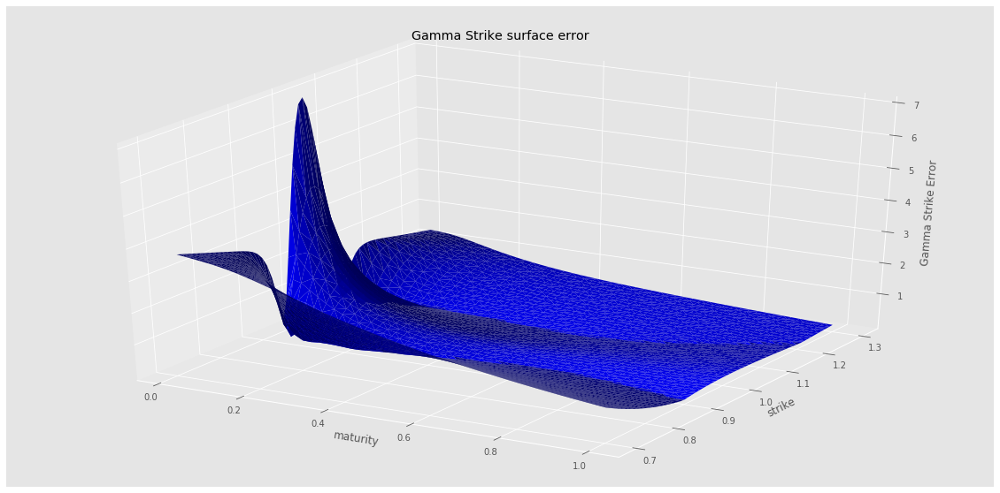

In [95]:
modelSummary(y_pred, volLocale, dNN_T, gNN_K)

## Dupire regularization

### Convex architecture

In [96]:
n_units = 50  # keys are number of hidden units
n_epoch = 100000
y_pred, volLocale, dNN_T, gNN_K, lossSerie=create_train_model_dupire(n_units, n_epoch,
                                                                     NNArchitecture,
                                                                     scaledDataSet,
                                                                     True)

w2S Tensor("split:0", shape=(50, 50), dtype=float32)
w2T Tensor("split:1", shape=(50, 50), dtype=float32)
w2 Tensor("dense_2/kernel:0", shape=(100, 50), dtype=float32_ref)
Strike Tensor("Placeholder:0", shape=(?, 1), dtype=float32)
w1S Tensor("dense/kernel:0", shape=(1, 50), dtype=float32_ref)
f0 Tensor("Sigmoid_1:0", shape=(?, 50), dtype=float32)
dL1S Tensor("mul:0", shape=(?, 50), dtype=float32)
w1T Tensor("dense_1/kernel:0", shape=(1, 50), dtype=float32_ref)
f1 Tensor("Sigmoid_4:0", shape=(?, 50), dtype=float32)
dL1T Tensor("mul_2:0", shape=(?, 50), dtype=float32)
dL2S Tensor("mul_4:0", shape=(?, 50), dtype=float32)
dL2T Tensor("mul_6:0", shape=(?, 50), dtype=float32)
gradS Tensor("MatMul_2:0", shape=(?, 1), dtype=float32)
gradM Tensor("MatMul_3:0", shape=(?, 1), dtype=float32)
hL1S Tensor("mul_8:0", shape=(?, 50), dtype=float32)
hL1T Tensor("mul_10:0", shape=(?, 50), dtype=float32)
hL2S Tensor("add:0", shape=(?, 50), dtype=float32)
hL2T Tensor("add_1:0", shape=(?, 50), dtype=float3

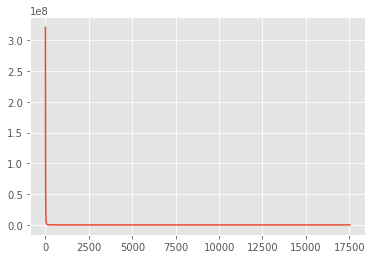

In [97]:
plt.plot(lossSerie)

In [98]:
lossSerie.iloc[-1]

5.552307605743408

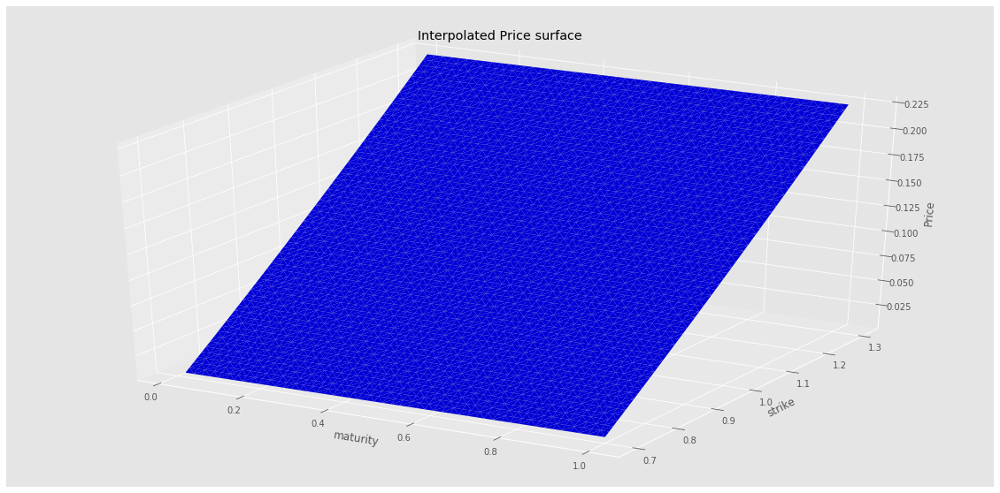

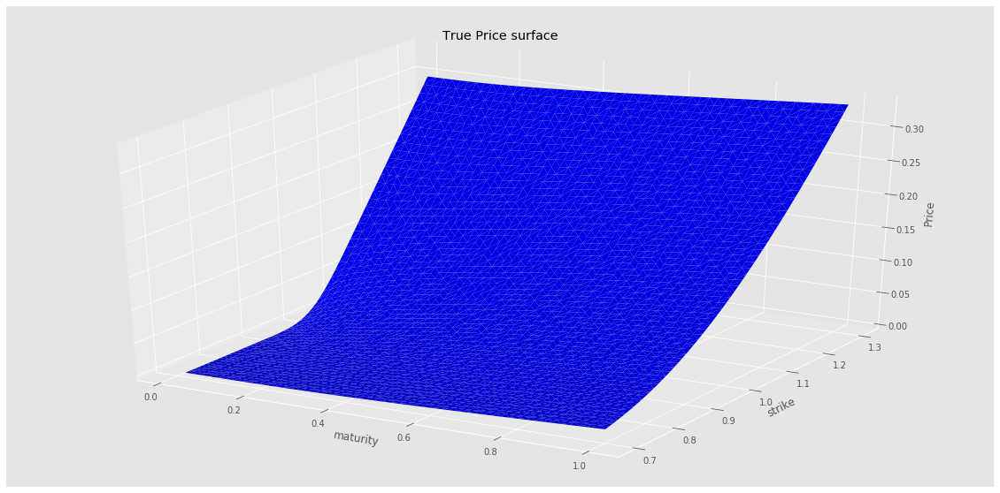

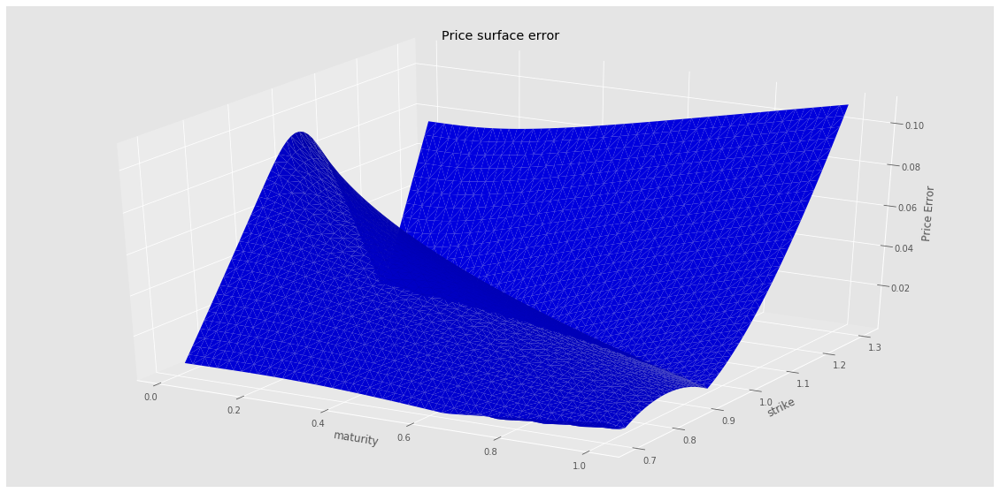

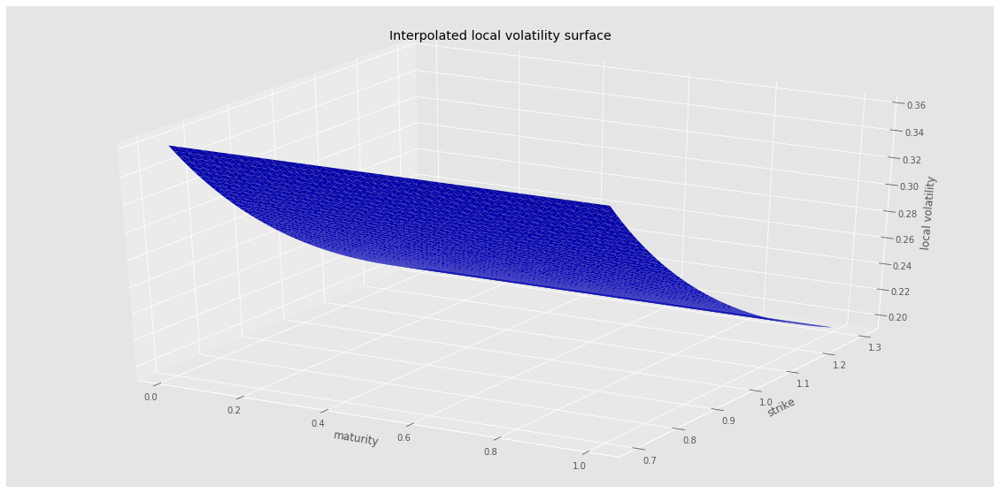

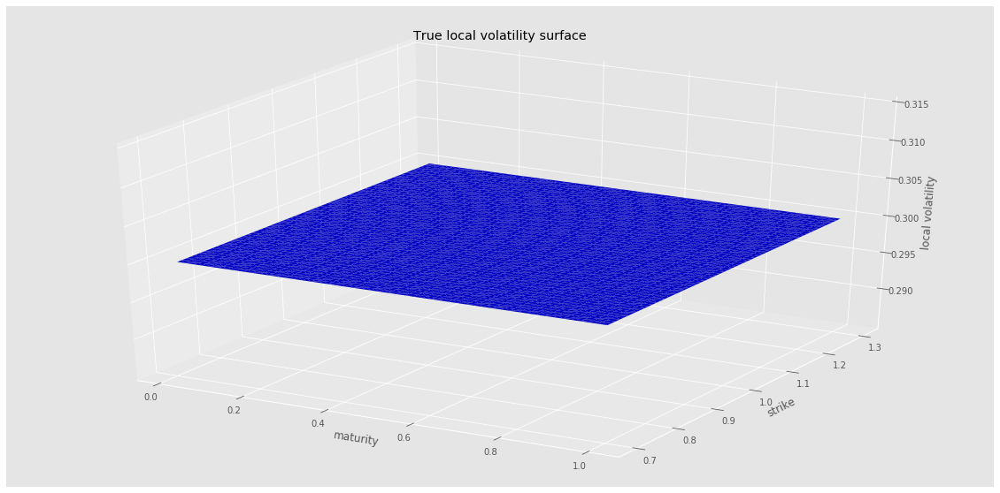

...

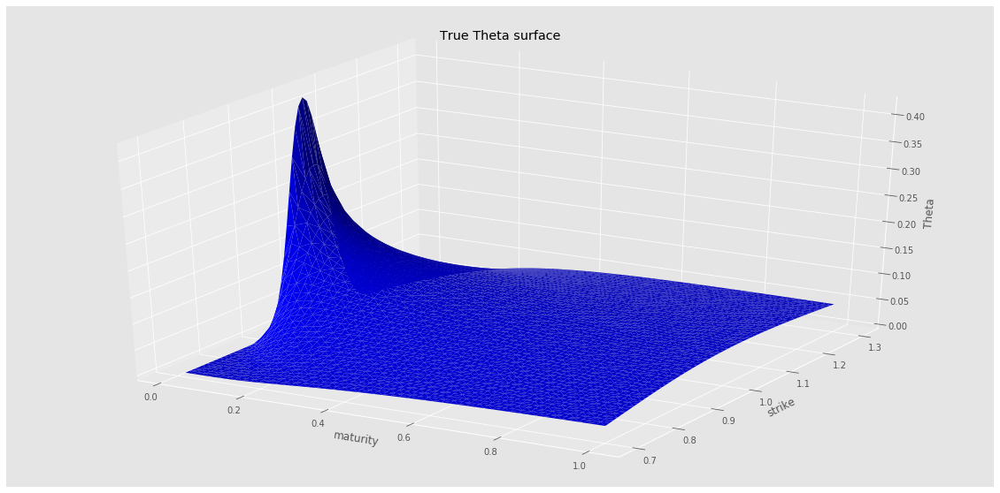

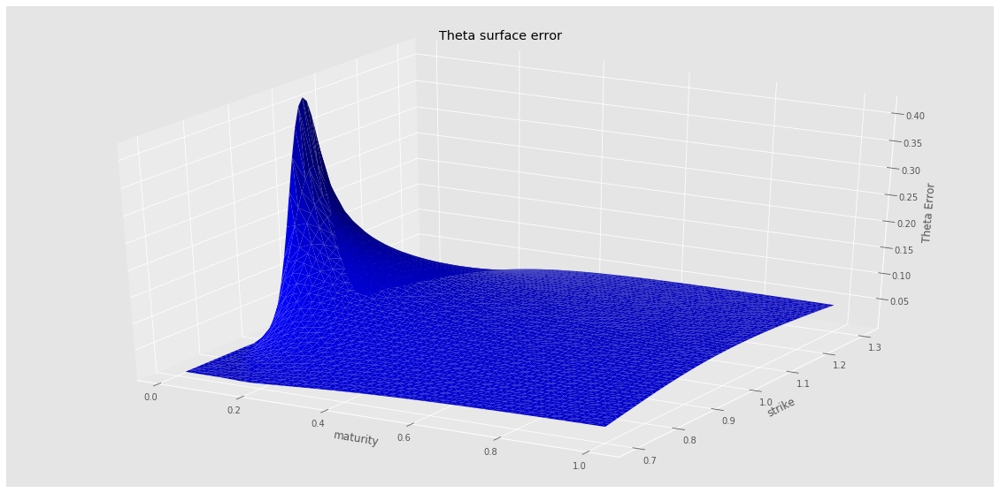

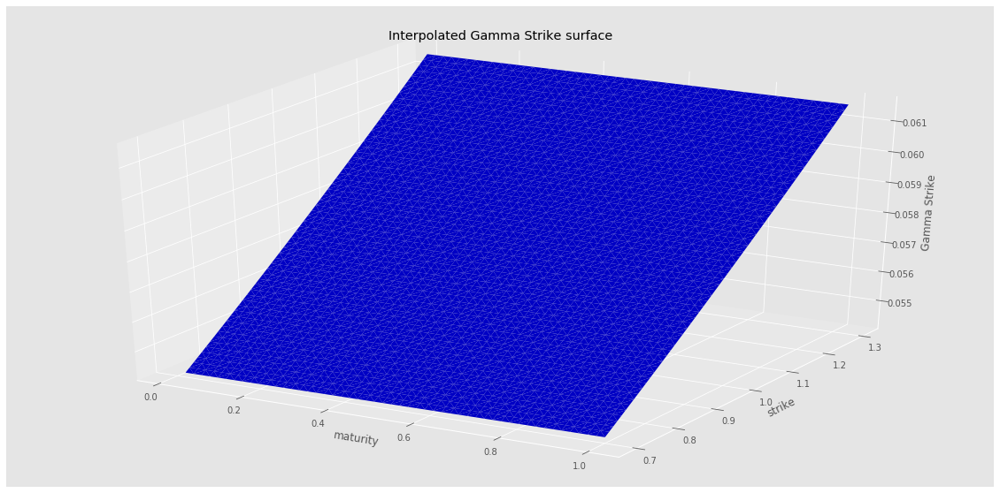

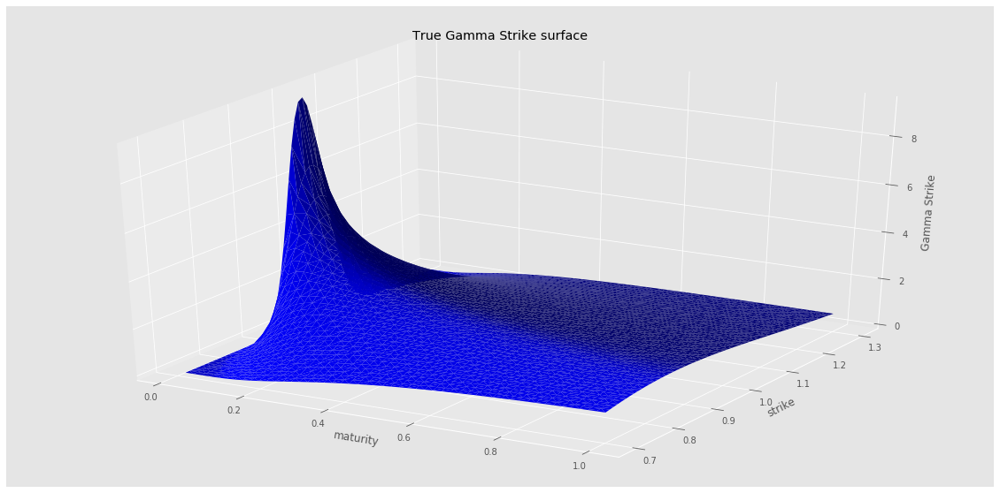

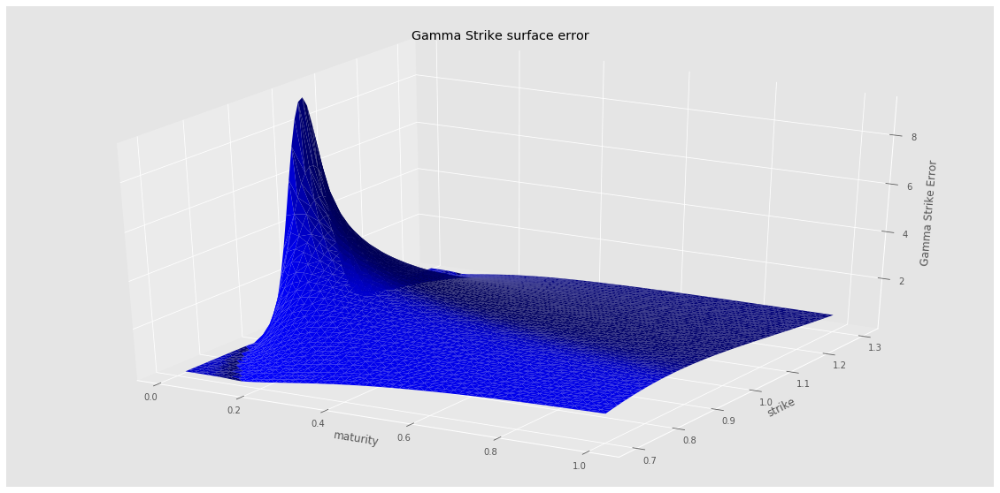

In [99]:
modelSummary(y_pred, volLocale, dNN_T, gNN_K)

### Unconstrained architecture

In [100]:
n_units=100  # keys are number of hidden units
n_epoch = 100000
y_pred, volLocale, dNN_T, gNN_K, lossSerie=create_train_model_dupire(n_units, n_epoch,
                                                                     NNArchitectureUnconstrained,
                                                                     scaledDataSet,
                                                                     True)

loss (hidden nodes: 100, iterations: 100000): nan


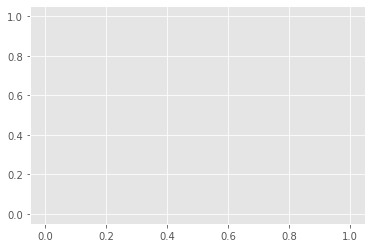

In [101]:
plt.plot(lossSerie)

In [102]:
lossSerie.iloc[-1]

nan

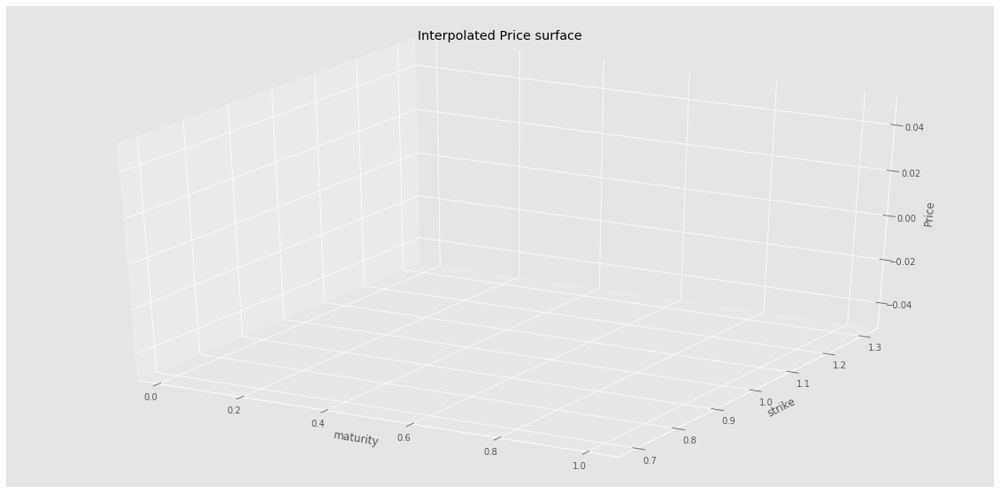

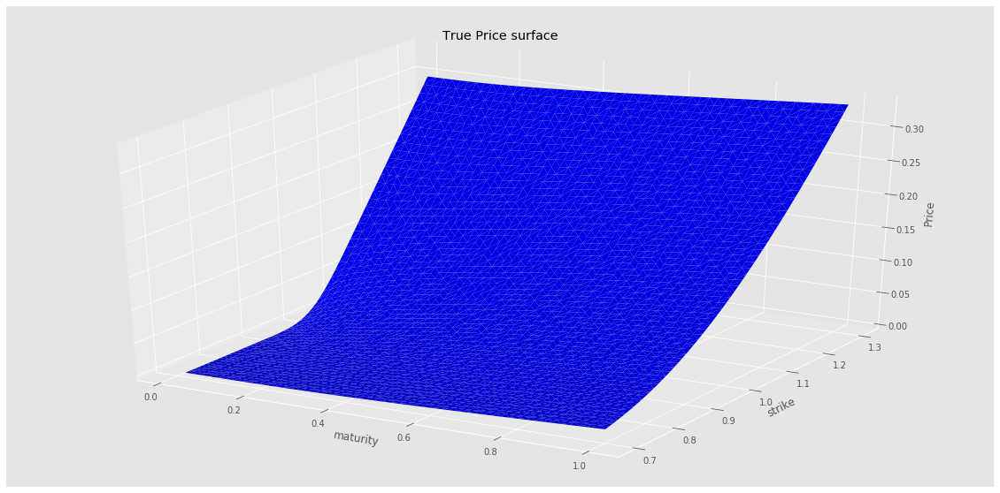

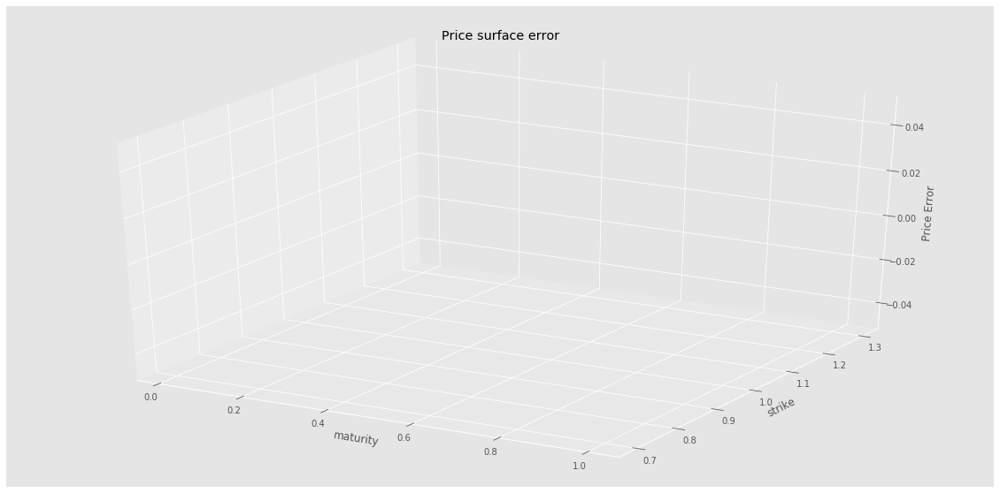

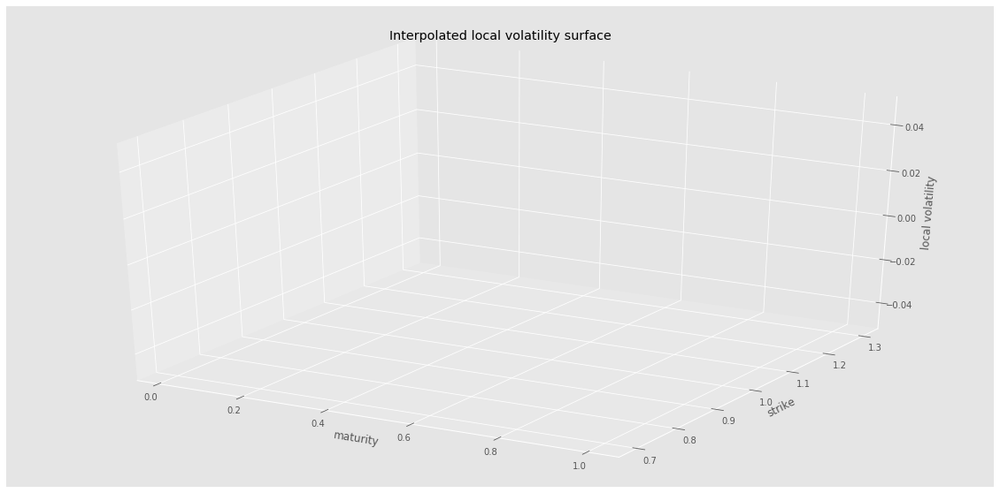

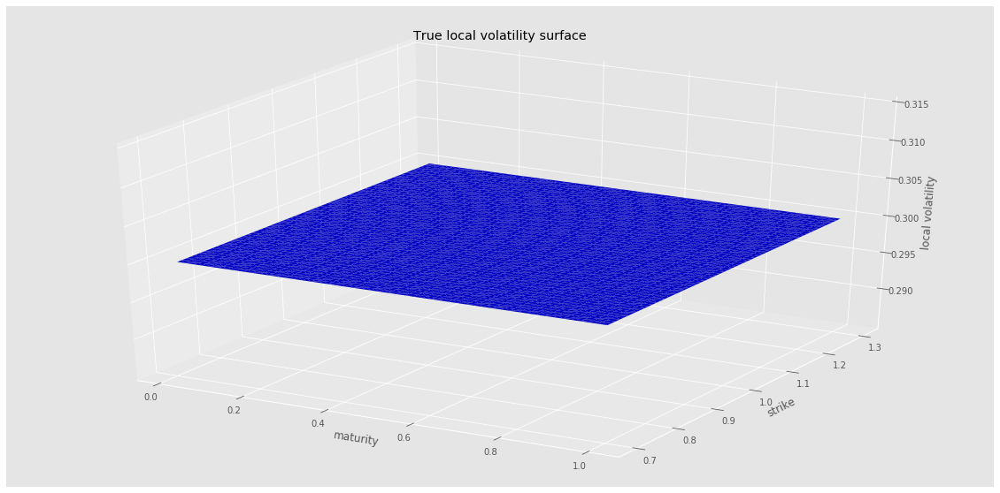

...

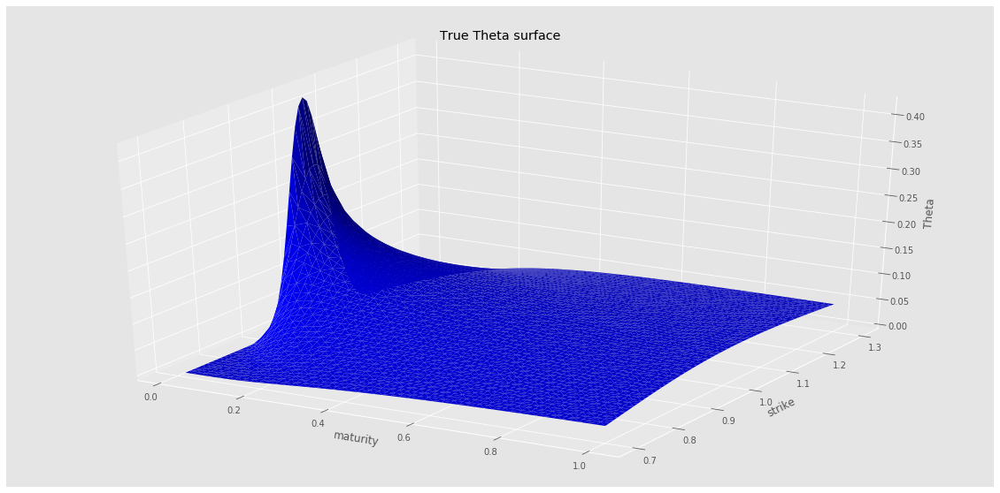

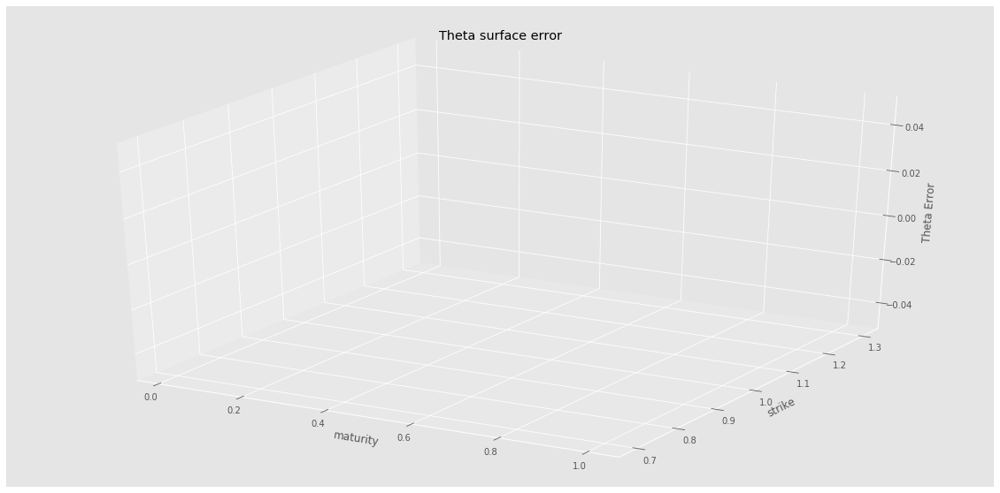

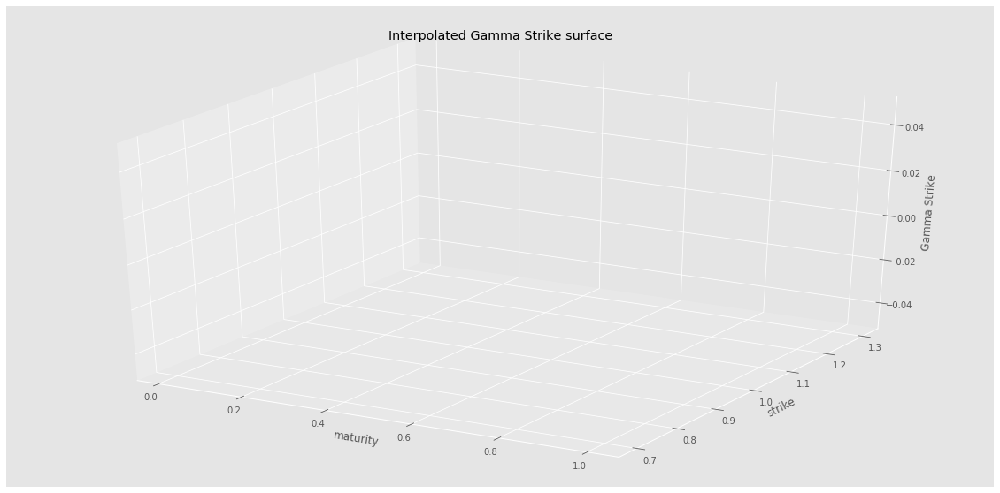

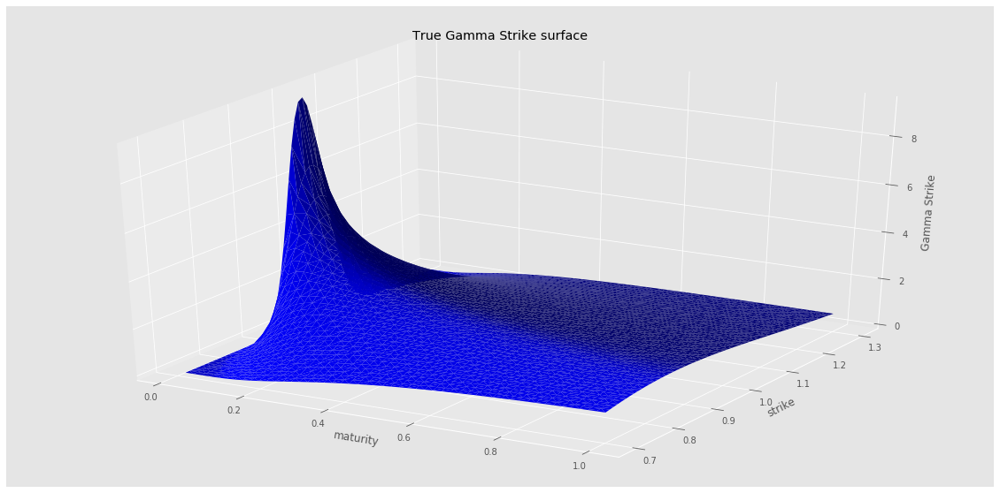

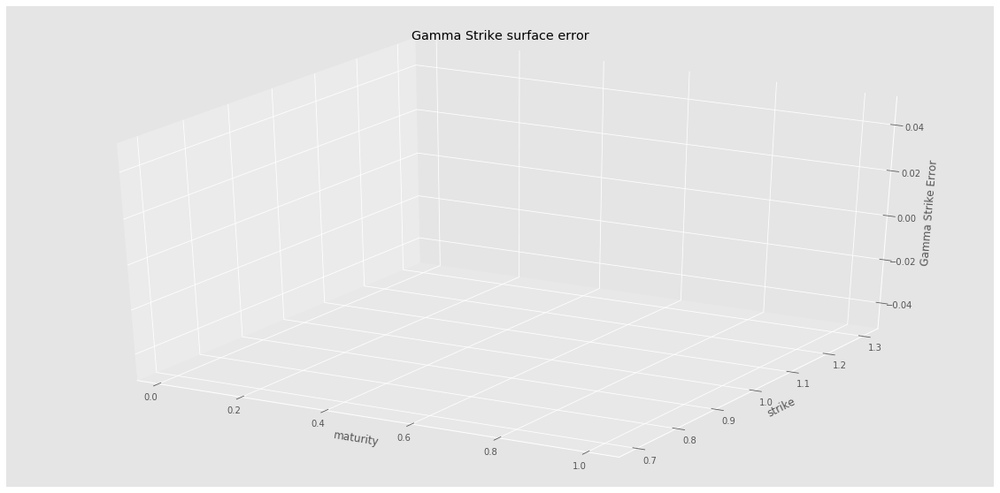

In [103]:
modelSummary(y_pred, volLocale, dNN_T, gNN_K)